In [31]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.datasets import mnist
from tensorflow.keras.layers import Dense, LeakyReLU, Reshape, Flatten
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam

In [32]:
# ------------------
# Hyperparameters
# ------------------
img_rows = 28
img_cols = 28
channels = 1
img_shape = (img_rows, img_cols, channels)
latent_dim = 100
n_critic = 5  # Number of discriminator updates per generator update

In [33]:
# ------------------
# Load and preprocess MNIST
# ------------------
(X_train, _), (_, _) = mnist.load_data()
X_train = (X_train.astype(np.float32) - 127.5) / 127.5  # Normalize to [-1, 1]
X_train = np.expand_dims(X_train, axis=-1)

In [34]:

# ------------------
# Build the Generator
# ------------------
def build_generator():
    model = Sequential()
    model.add(Dense(32, input_dim=latent_dim))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dense(64))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dense(128))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dense(np.prod(img_shape), activation='tanh'))
    model.add(Reshape(img_shape))
    return model


In [35]:
# ------------------
# Build the Discriminator
# ------------------
def build_discriminator():
    model = Sequential()
    model.add(Flatten(input_shape=img_shape))
    model.add(Dense(128))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dense(64))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dense(32))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dense(1, activation='sigmoid'))
    return model

In [39]:
# — 1) Define your optimizers (TTUR) —
opt_d = Adam(4e-4, beta_1=0.5)   # Discriminator: higher LR
opt_g = Adam(2e-4, beta_1=0.5)   # Generator: lower LR

# — 2) Build & compile Discriminator —
discriminator = build_discriminator()
discriminator.compile(
    loss='binary_crossentropy',
    optimizer=opt_d,
    metrics=['accuracy']
)

# — 3) Build Generator (nothing to compile yet) —
generator = build_generator()

# — 4) Build the combined GAN graph —
#    a) freeze D so that in this graph only G’s weights get updated
discriminator.trainable = False

#    b) GAN input is noise vector z
z = Input(shape=(latent_dim,))
#    c) G(z) produces an image
img = generator(z)
#    d) D(G(z)) produces “real/fake”
valid = discriminator(img)

#    e) carve out a Model that maps z -> valid
combined = Model(z, valid, name='GAN')

# — 5) Compile the combined model with G’s optimizer —
combined.compile(
    loss='binary_crossentropy',
    optimizer=opt_g
)

# — Done! —
print(discriminator.summary())
print(generator.summary())
print(combined.summary())

Model: "sequential_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_6 (Flatten)         (None, 784)               0         
                                                                 
 dense_48 (Dense)            (None, 128)               100480    
                                                                 
 leaky_re_lu_36 (LeakyReLU)  (None, 128)               0         
                                                                 
 dense_49 (Dense)            (None, 64)                8256      
                                                                 
 leaky_re_lu_37 (LeakyReLU)  (None, 64)                0         
                                                                 
 dense_50 (Dense)            (None, 32)                2080      
                                                                 
 leaky_re_lu_38 (LeakyReLU)  (None, 32)              

In [40]:
# ------------------
# Tracking metrics
# ------------------
d_losses = []
g_losses = []
d_accuracies = []

def train(epochs, batch_size=128, print_interval=1, sample_interval=50):
    half_batch = batch_size // 2
    half_batch = batch_size // 2
    noise_std = 0.05
    for epoch in range(1, epochs+1):
        #  Train Discriminator more times per iteration
        for _ in range(n_critic):
            # Select a random half-batch of real images
            idx = np.random.randint(0, X_train.shape[0], half_batch)
            real_imgs = X_train[idx]

            # Generate a half-batch of fake images
            noise = np.random.normal(0, 1, (half_batch, latent_dim))
            gen_imgs = generator.predict(noise, verbose=0)

            # Add instance noise
            real_noisy = real_imgs + np.random.normal(0, noise_std, real_imgs.shape)
            fake_noisy = gen_imgs + np.random.normal(0, noise_std, gen_imgs.shape)

            # Label smoothing for real, zeros for fake
            real_labels = np.ones((half_batch, 1)) * 0.9
            fake_labels = np.zeros((half_batch, 1))

            # Train discriminator
            d_loss_real = discriminator.train_on_batch(real_noisy, real_labels)
            d_loss_fake = discriminator.train_on_batch(fake_noisy, fake_labels)

        #  Train Generator
        noise = np.random.normal(0, 1, (batch_size, latent_dim))
        valid_y = np.ones((batch_size, 1))  # aim to fool the discriminator
        g_loss = combined.train_on_batch(noise, valid_y)

        #  Print progress
        if epoch % print_interval == 0 or epoch == 1:
            d_loss = 0.5 * (d_loss_real[0] + d_loss_fake[0])
            d_acc  = 0.5 * (d_loss_real[1] + d_loss_fake[1])
            print(f"{epoch:5d} [D loss: {d_loss:.4f}, acc.: {d_acc:.2%}] [G loss: {g_loss:.4f}]")
        if epoch % sample_interval == 0 or epoch == 1:
            sample_images(epoch, grid_size=5)

# After training, plot the results
def plot_training_progress():
    import matplotlib.pyplot as plt

    epochs_range = range(len(g_losses))

    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, d_losses, label='Discriminator Loss')
    plt.plot(epochs_range, g_losses, label='Generator Loss')
    plt.title('Loss During Training')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, d_accuracies, label='Discriminator Accuracy')
    plt.title('Discriminator Accuracy During Training')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.tight_layout()
    plt.show()

# ------------------
# Save generated images
# ------------------
def sample_images(epoch, grid_size=5):
    noise = np.random.normal(0, 1, (grid_size**2, latent_dim))
    gen_imgs = generator.predict(noise)

    gen_imgs = 0.5 * gen_imgs + 0.5  # Rescale to [0, 1]

    fig, axs = plt.subplots(grid_size, grid_size, figsize=(5, 5))
    count = 0
    for i in range(grid_size):
        for j in range(grid_size):
            axs[i, j].imshow(gen_imgs[count, :, :, 0], cmap='gray')
            axs[i, j].axis('off')
            count += 1
    plt.suptitle(f"Epoch {epoch}")
    plt.tight_layout()
    plt.show()


    1 [D loss: 0.4483, acc.: 50.00%] [G loss: 0.8789]
1/1 [==============================] - 0s 54ms/step


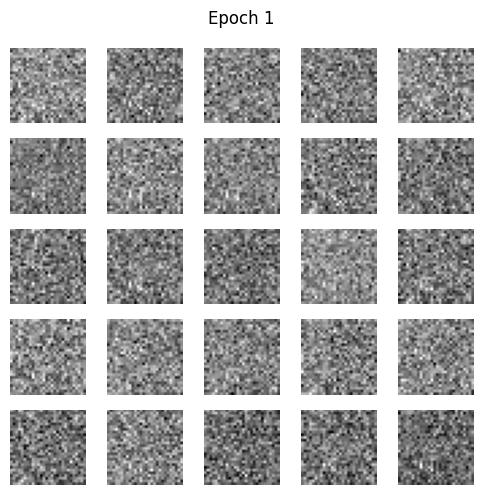

    2 [D loss: 0.3574, acc.: 50.00%] [G loss: 1.2210]
    3 [D loss: 0.2850, acc.: 50.00%] [G loss: 1.7757]
    4 [D loss: 0.2320, acc.: 50.00%] [G loss: 2.2071]
    5 [D loss: 0.2135, acc.: 50.00%] [G loss: 2.6680]
    6 [D loss: 0.1999, acc.: 50.00%] [G loss: 3.0949]
    7 [D loss: 0.1921, acc.: 50.00%] [G loss: 3.5383]
    8 [D loss: 0.1833, acc.: 50.00%] [G loss: 3.7493]
    9 [D loss: 0.1796, acc.: 50.00%] [G loss: 3.8747]
   10 [D loss: 0.1807, acc.: 50.00%] [G loss: 3.8723]
   11 [D loss: 0.1804, acc.: 50.00%] [G loss: 4.1007]
   12 [D loss: 0.1809, acc.: 50.00%] [G loss: 4.0740]
   13 [D loss: 0.1797, acc.: 50.00%] [G loss: 4.1516]
   14 [D loss: 0.1769, acc.: 50.00%] [G loss: 4.2196]
   15 [D loss: 0.1779, acc.: 50.00%] [G loss: 4.2662]
   16 [D loss: 0.1796, acc.: 50.00%] [G loss: 4.4427]
   17 [D loss: 0.1796, acc.: 50.00%] [G loss: 4.1856]
   18 [D loss: 0.1765, acc.: 50.00%] [G loss: 4.2280]
   19 [D loss: 0.1815, acc.: 50.00%] [G loss: 4.2984]
   20 [D loss: 0.1769, acc.:

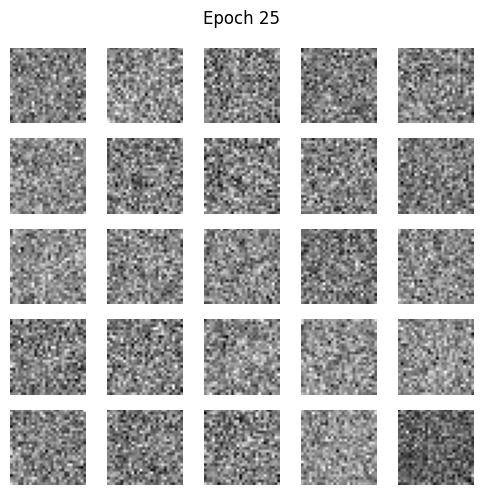

   26 [D loss: 0.1780, acc.: 50.00%] [G loss: 4.2567]
   27 [D loss: 0.1720, acc.: 50.00%] [G loss: 4.3734]
   28 [D loss: 0.1744, acc.: 50.00%] [G loss: 4.3719]
   29 [D loss: 0.1772, acc.: 50.00%] [G loss: 4.0411]
   30 [D loss: 0.1721, acc.: 50.00%] [G loss: 4.5318]
   31 [D loss: 0.1710, acc.: 50.00%] [G loss: 4.6820]
   32 [D loss: 0.1716, acc.: 50.00%] [G loss: 4.4402]
   33 [D loss: 0.1704, acc.: 50.00%] [G loss: 4.4328]
   34 [D loss: 0.1709, acc.: 50.00%] [G loss: 4.5713]
   35 [D loss: 0.1707, acc.: 50.00%] [G loss: 4.7612]
   36 [D loss: 0.1682, acc.: 50.00%] [G loss: 4.8305]
   37 [D loss: 0.1680, acc.: 50.00%] [G loss: 4.8953]
   38 [D loss: 0.1694, acc.: 50.00%] [G loss: 4.7951]
   39 [D loss: 0.1680, acc.: 50.00%] [G loss: 5.0013]
   40 [D loss: 0.1702, acc.: 50.00%] [G loss: 5.0654]
   41 [D loss: 0.1683, acc.: 50.00%] [G loss: 5.0885]
   42 [D loss: 0.1662, acc.: 50.00%] [G loss: 5.1146]
   43 [D loss: 0.1674, acc.: 50.00%] [G loss: 5.2324]
   44 [D loss: 0.1661, acc.:

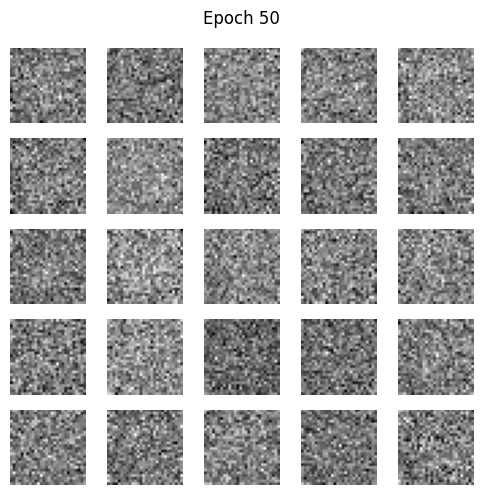

   51 [D loss: 0.1693, acc.: 50.00%] [G loss: 5.3059]
   52 [D loss: 0.1652, acc.: 50.00%] [G loss: 5.6096]
   53 [D loss: 0.1648, acc.: 50.00%] [G loss: 5.8383]
   54 [D loss: 0.1648, acc.: 50.00%] [G loss: 5.9350]
   55 [D loss: 0.1652, acc.: 50.00%] [G loss: 5.8889]
   56 [D loss: 0.1645, acc.: 50.00%] [G loss: 6.0364]
   57 [D loss: 0.1656, acc.: 50.00%] [G loss: 5.8656]
   58 [D loss: 0.1647, acc.: 50.00%] [G loss: 6.1942]
   59 [D loss: 0.1641, acc.: 50.00%] [G loss: 6.1771]
   60 [D loss: 0.1676, acc.: 50.00%] [G loss: 6.3908]
   61 [D loss: 0.1650, acc.: 50.00%] [G loss: 6.2316]
   62 [D loss: 0.1658, acc.: 50.00%] [G loss: 6.3683]
   63 [D loss: 0.1639, acc.: 50.00%] [G loss: 6.4690]
   64 [D loss: 0.1636, acc.: 50.00%] [G loss: 6.7684]
   65 [D loss: 0.1647, acc.: 50.00%] [G loss: 6.7050]
   66 [D loss: 0.1650, acc.: 50.00%] [G loss: 6.5235]
   67 [D loss: 0.1636, acc.: 50.00%] [G loss: 6.7651]
   68 [D loss: 0.1640, acc.: 50.00%] [G loss: 6.7197]
   69 [D loss: 0.1639, acc.:

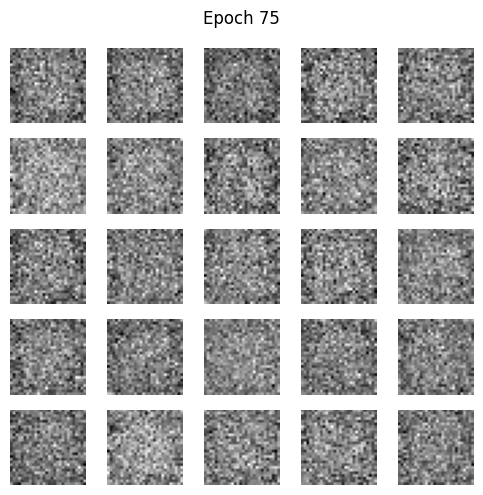

   76 [D loss: 0.1632, acc.: 50.00%] [G loss: 7.2918]
   77 [D loss: 0.1640, acc.: 50.00%] [G loss: 7.4338]
   78 [D loss: 0.1640, acc.: 50.00%] [G loss: 7.0501]
   79 [D loss: 0.1638, acc.: 50.00%] [G loss: 7.1578]
   80 [D loss: 0.1637, acc.: 50.00%] [G loss: 7.4158]
   81 [D loss: 0.1631, acc.: 50.00%] [G loss: 7.4974]
   82 [D loss: 0.1663, acc.: 50.00%] [G loss: 7.0774]
   83 [D loss: 0.1633, acc.: 50.00%] [G loss: 7.5735]
   84 [D loss: 0.1633, acc.: 50.00%] [G loss: 7.7003]
   85 [D loss: 0.1639, acc.: 50.00%] [G loss: 7.2457]
   86 [D loss: 0.1647, acc.: 50.00%] [G loss: 7.6981]
   87 [D loss: 0.1638, acc.: 50.00%] [G loss: 7.6690]
   88 [D loss: 0.1631, acc.: 50.00%] [G loss: 7.9554]
   89 [D loss: 0.1658, acc.: 50.00%] [G loss: 6.8876]
   90 [D loss: 0.1643, acc.: 50.00%] [G loss: 15.9138]
   91 [D loss: 0.8035, acc.: 1.00%] [G loss: 0.6012]
   92 [D loss: 0.3678, acc.: 50.00%] [G loss: 1.1996]
   93 [D loss: 0.3006, acc.: 50.00%] [G loss: 1.5439]
   94 [D loss: 0.2687, acc.:

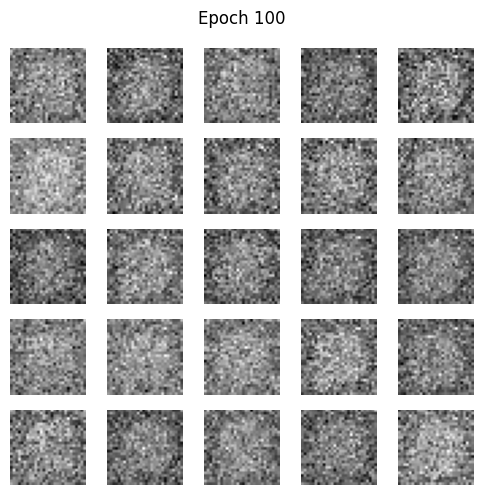

  101 [D loss: 0.1833, acc.: 50.00%] [G loss: 3.4785]
  102 [D loss: 0.1841, acc.: 50.00%] [G loss: 3.6911]
  103 [D loss: 0.1841, acc.: 50.00%] [G loss: 3.7359]
  104 [D loss: 0.1803, acc.: 50.00%] [G loss: 3.8536]
  105 [D loss: 0.1832, acc.: 50.00%] [G loss: 3.7312]
  106 [D loss: 0.1803, acc.: 50.00%] [G loss: 3.8960]
  107 [D loss: 0.1838, acc.: 50.00%] [G loss: 3.7235]
  108 [D loss: 0.1823, acc.: 50.00%] [G loss: 4.0016]
  109 [D loss: 0.1788, acc.: 50.00%] [G loss: 3.8566]
  110 [D loss: 0.1818, acc.: 50.00%] [G loss: 3.6471]
  111 [D loss: 0.2358, acc.: 50.00%] [G loss: 3.6445]
  112 [D loss: 0.1811, acc.: 50.00%] [G loss: 3.7689]
  113 [D loss: 0.1980, acc.: 50.00%] [G loss: 3.3815]
  114 [D loss: 0.1897, acc.: 50.00%] [G loss: 3.4866]
  115 [D loss: 0.1867, acc.: 50.00%] [G loss: 3.5916]
  116 [D loss: 0.2103, acc.: 50.00%] [G loss: 3.1801]
  117 [D loss: 0.2087, acc.: 50.00%] [G loss: 3.8274]
  118 [D loss: 0.2997, acc.: 50.00%] [G loss: 3.1752]
  119 [D loss: 0.1861, acc.:

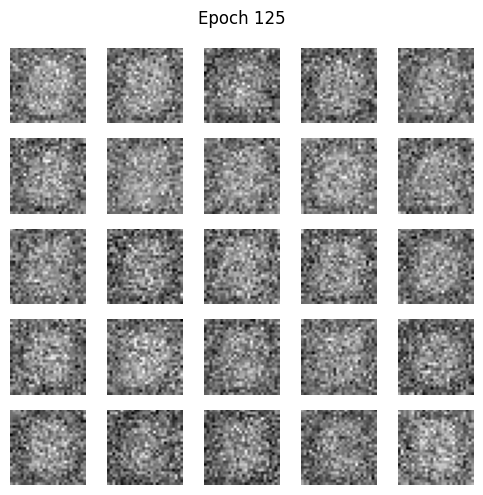

  126 [D loss: 0.2300, acc.: 50.00%] [G loss: 2.8457]
  127 [D loss: 0.1937, acc.: 50.00%] [G loss: 3.5648]
  128 [D loss: 0.2103, acc.: 50.00%] [G loss: 4.0000]
  129 [D loss: 0.1857, acc.: 50.00%] [G loss: 3.8337]
  130 [D loss: 0.2343, acc.: 50.00%] [G loss: 3.7213]
  131 [D loss: 0.4748, acc.: 43.00%] [G loss: 0.9464]
  132 [D loss: 0.2144, acc.: 50.00%] [G loss: 3.8512]
  133 [D loss: 0.1738, acc.: 50.00%] [G loss: 4.5227]
  134 [D loss: 0.1814, acc.: 50.00%] [G loss: 4.2762]
  135 [D loss: 0.1844, acc.: 50.00%] [G loss: 3.8659]
  136 [D loss: 0.4684, acc.: 42.00%] [G loss: 1.2298]
  137 [D loss: 0.1804, acc.: 50.00%] [G loss: 4.3403]
  138 [D loss: 0.1746, acc.: 50.00%] [G loss: 4.5819]
  139 [D loss: 0.1745, acc.: 50.00%] [G loss: 4.4542]
  140 [D loss: 0.1763, acc.: 50.00%] [G loss: 4.8108]
  141 [D loss: 0.1983, acc.: 50.00%] [G loss: 4.2783]
  142 [D loss: 0.1893, acc.: 50.00%] [G loss: 3.9045]
  143 [D loss: 0.1733, acc.: 50.00%] [G loss: 4.4856]
  144 [D loss: 0.1727, acc.:

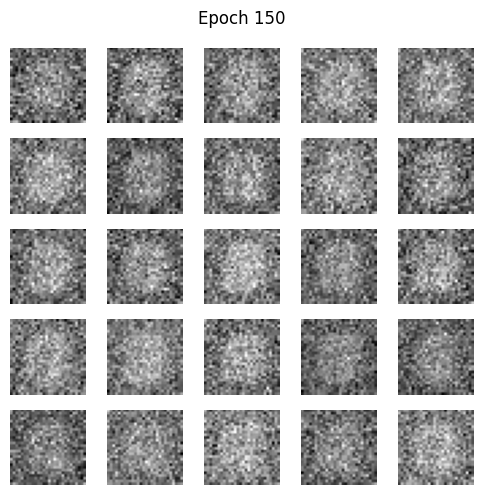

  151 [D loss: 0.1687, acc.: 50.00%] [G loss: 5.1975]
  152 [D loss: 0.1783, acc.: 50.00%] [G loss: 5.8588]
  153 [D loss: 0.1682, acc.: 50.00%] [G loss: 5.3550]
  154 [D loss: 0.1696, acc.: 50.00%] [G loss: 5.2677]
  155 [D loss: 0.1694, acc.: 50.00%] [G loss: 5.2891]
  156 [D loss: 0.1702, acc.: 50.00%] [G loss: 5.3205]
  157 [D loss: 0.1881, acc.: 50.00%] [G loss: 4.0086]
  158 [D loss: 0.1720, acc.: 50.00%] [G loss: 5.3177]
  159 [D loss: 0.2045, acc.: 50.00%] [G loss: 3.8724]
  160 [D loss: 0.1674, acc.: 50.00%] [G loss: 6.1927]
  161 [D loss: 0.1726, acc.: 50.00%] [G loss: 5.2782]
  162 [D loss: 0.1831, acc.: 50.00%] [G loss: 5.2742]
  163 [D loss: 0.1975, acc.: 50.00%] [G loss: 4.4096]
  164 [D loss: 0.1678, acc.: 50.00%] [G loss: 6.0274]
  165 [D loss: 0.1696, acc.: 50.00%] [G loss: 5.3853]
  166 [D loss: 0.1667, acc.: 50.00%] [G loss: 5.3963]
  167 [D loss: 0.1774, acc.: 50.00%] [G loss: 4.5464]
  168 [D loss: 0.1674, acc.: 50.00%] [G loss: 5.7747]
  169 [D loss: 0.1693, acc.:

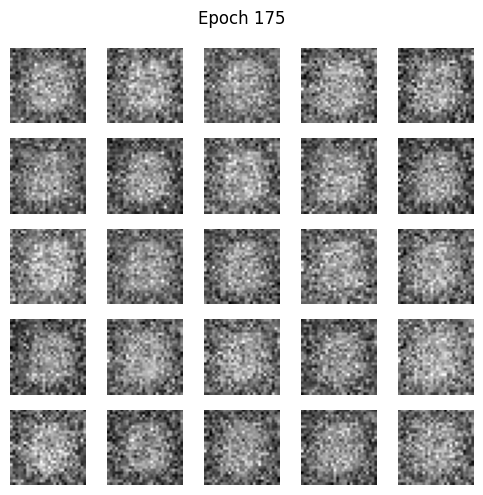

  176 [D loss: 0.1753, acc.: 50.00%] [G loss: 5.0054]
  177 [D loss: 0.1731, acc.: 50.00%] [G loss: 5.5535]
  178 [D loss: 0.1695, acc.: 50.00%] [G loss: 5.5649]
  179 [D loss: 0.1699, acc.: 50.00%] [G loss: 5.5819]
  180 [D loss: 0.1814, acc.: 50.00%] [G loss: 4.3657]
  181 [D loss: 0.1754, acc.: 50.00%] [G loss: 5.1213]
  182 [D loss: 1.0943, acc.: 4.00%] [G loss: 0.7320]
  183 [D loss: 0.1915, acc.: 50.00%] [G loss: 3.8101]
  184 [D loss: 0.1758, acc.: 50.00%] [G loss: 4.1608]
  185 [D loss: 0.1757, acc.: 50.00%] [G loss: 4.2407]
  186 [D loss: 0.1735, acc.: 50.00%] [G loss: 4.5240]
  187 [D loss: 0.1790, acc.: 50.00%] [G loss: 4.1526]
  188 [D loss: 0.1743, acc.: 50.00%] [G loss: 4.4205]
  189 [D loss: 0.1731, acc.: 50.00%] [G loss: 4.5746]
  190 [D loss: 0.1784, acc.: 50.00%] [G loss: 4.7846]
  191 [D loss: 0.1884, acc.: 50.00%] [G loss: 4.1510]
  192 [D loss: 0.1707, acc.: 50.00%] [G loss: 5.2091]
  193 [D loss: 0.1737, acc.: 50.00%] [G loss: 4.9916]
  194 [D loss: 0.1745, acc.: 

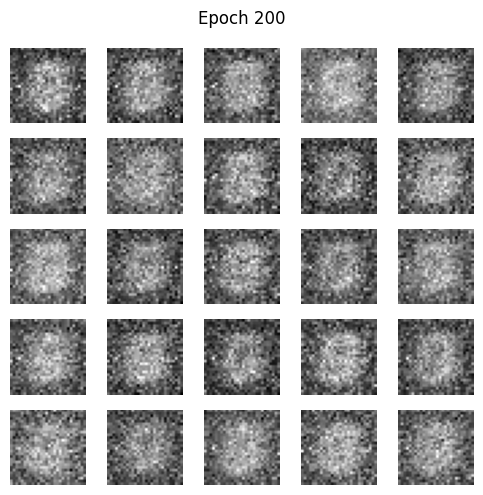

  201 [D loss: 0.1750, acc.: 50.00%] [G loss: 5.4803]
  202 [D loss: 0.1700, acc.: 50.00%] [G loss: 5.3059]
  203 [D loss: 0.1807, acc.: 50.00%] [G loss: 4.8387]
  204 [D loss: 0.1724, acc.: 50.00%] [G loss: 5.3463]
  205 [D loss: 0.1688, acc.: 50.00%] [G loss: 6.0888]
  206 [D loss: 0.2185, acc.: 50.00%] [G loss: 4.0368]
  207 [D loss: 0.1697, acc.: 50.00%] [G loss: 5.4584]
  208 [D loss: 0.1726, acc.: 50.00%] [G loss: 5.2600]
  209 [D loss: 0.1819, acc.: 50.00%] [G loss: 5.7248]
  210 [D loss: 0.1727, acc.: 50.00%] [G loss: 5.1088]
  211 [D loss: 0.1824, acc.: 50.00%] [G loss: 5.2873]
  212 [D loss: 0.1649, acc.: 50.00%] [G loss: 8.2313]
  213 [D loss: 0.3281, acc.: 50.00%] [G loss: 2.3988]
  214 [D loss: 0.4008, acc.: 50.00%] [G loss: 1.3368]
  215 [D loss: 0.3058, acc.: 50.00%] [G loss: 2.0767]
  216 [D loss: 0.2063, acc.: 50.00%] [G loss: 3.2387]
  217 [D loss: 0.1851, acc.: 50.00%] [G loss: 3.6527]
  218 [D loss: 0.1823, acc.: 50.00%] [G loss: 3.7701]
  219 [D loss: 0.1951, acc.:

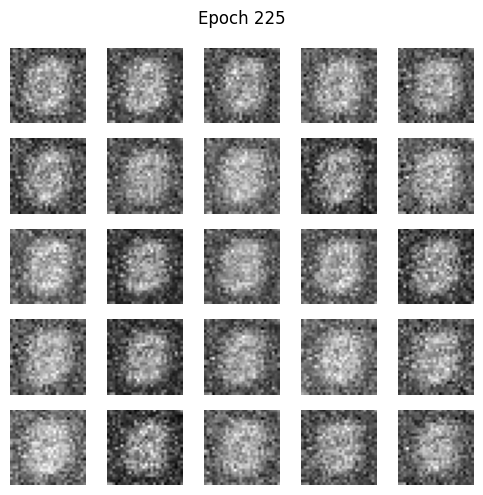

  226 [D loss: 0.1936, acc.: 50.00%] [G loss: 3.7549]
  227 [D loss: 0.2311, acc.: 50.00%] [G loss: 3.3147]
  228 [D loss: 0.2199, acc.: 50.00%] [G loss: 3.4008]
  229 [D loss: 0.1988, acc.: 50.00%] [G loss: 3.9253]
  230 [D loss: 0.1959, acc.: 50.00%] [G loss: 3.3994]
  231 [D loss: 0.5058, acc.: 39.00%] [G loss: 2.1372]
  232 [D loss: 0.1921, acc.: 50.00%] [G loss: 3.7751]
  233 [D loss: 0.2383, acc.: 50.00%] [G loss: 2.9433]
  234 [D loss: 0.3451, acc.: 50.00%] [G loss: 2.3580]
  235 [D loss: 0.2518, acc.: 50.00%] [G loss: 2.6303]
  236 [D loss: 0.2490, acc.: 50.00%] [G loss: 2.6108]
  237 [D loss: 0.2045, acc.: 50.00%] [G loss: 3.1833]
  238 [D loss: 0.3217, acc.: 50.00%] [G loss: 2.1650]
  239 [D loss: 0.2074, acc.: 50.00%] [G loss: 3.4205]
  240 [D loss: 0.2115, acc.: 50.00%] [G loss: 3.4855]
  241 [D loss: 0.2252, acc.: 50.00%] [G loss: 3.1419]
  242 [D loss: 0.2512, acc.: 50.00%] [G loss: 3.4718]
  243 [D loss: 0.2129, acc.: 50.00%] [G loss: 3.5707]
  244 [D loss: 0.1937, acc.:

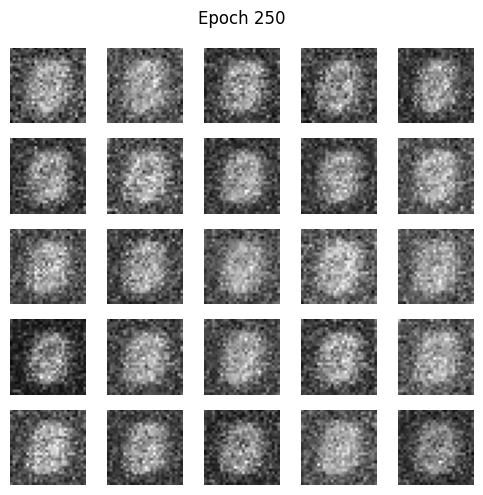

  251 [D loss: 0.2282, acc.: 50.00%] [G loss: 3.1658]
  252 [D loss: 0.2284, acc.: 50.00%] [G loss: 3.4056]
  253 [D loss: 0.1897, acc.: 50.00%] [G loss: 3.5878]
  254 [D loss: 0.1879, acc.: 50.00%] [G loss: 3.6853]
  255 [D loss: 0.1988, acc.: 50.00%] [G loss: 3.9098]
  256 [D loss: 0.2641, acc.: 50.00%] [G loss: 3.2276]
  257 [D loss: 0.2172, acc.: 50.00%] [G loss: 3.5271]
  258 [D loss: 0.2089, acc.: 50.00%] [G loss: 3.5489]
  259 [D loss: 0.2062, acc.: 50.00%] [G loss: 3.2982]
  260 [D loss: 0.1936, acc.: 50.00%] [G loss: 3.9468]
  261 [D loss: 0.2202, acc.: 50.00%] [G loss: 3.4345]
  262 [D loss: 0.2398, acc.: 50.00%] [G loss: 3.5788]
  263 [D loss: 0.2023, acc.: 50.00%] [G loss: 3.5536]
  264 [D loss: 0.1916, acc.: 50.00%] [G loss: 3.7012]
  265 [D loss: 0.2158, acc.: 50.00%] [G loss: 4.0942]
  266 [D loss: 0.2004, acc.: 50.00%] [G loss: 3.5619]
  267 [D loss: 0.2255, acc.: 50.00%] [G loss: 3.1375]
  268 [D loss: 0.1929, acc.: 50.00%] [G loss: 3.7761]
  269 [D loss: 0.1903, acc.:

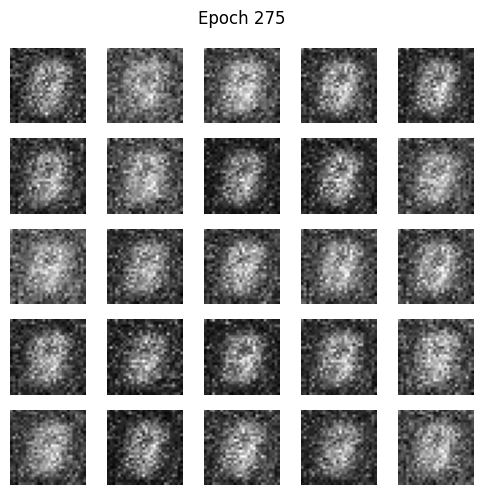

  276 [D loss: 0.1892, acc.: 50.00%] [G loss: 4.1053]
  277 [D loss: 0.1883, acc.: 50.00%] [G loss: 4.6159]
  278 [D loss: 0.3514, acc.: 49.00%] [G loss: 2.7181]
  279 [D loss: 0.1811, acc.: 50.00%] [G loss: 4.4600]
  280 [D loss: 0.1818, acc.: 50.00%] [G loss: 4.6065]
  281 [D loss: 0.1770, acc.: 50.00%] [G loss: 4.4777]
  282 [D loss: 0.1807, acc.: 50.00%] [G loss: 4.4322]
  283 [D loss: 0.1790, acc.: 50.00%] [G loss: 4.5988]
  284 [D loss: 0.1930, acc.: 50.00%] [G loss: 3.9451]
  285 [D loss: 0.3789, acc.: 49.00%] [G loss: 3.4204]
  286 [D loss: 0.1763, acc.: 50.00%] [G loss: 4.7686]
  287 [D loss: 0.1797, acc.: 50.00%] [G loss: 4.6068]
  288 [D loss: 0.1786, acc.: 50.00%] [G loss: 4.7125]
  289 [D loss: 0.1830, acc.: 50.00%] [G loss: 4.6966]
  290 [D loss: 0.1752, acc.: 50.00%] [G loss: 4.8372]
  291 [D loss: 0.1767, acc.: 50.00%] [G loss: 4.7926]
  292 [D loss: 0.2361, acc.: 50.00%] [G loss: 3.9715]
  293 [D loss: 0.1830, acc.: 50.00%] [G loss: 4.5079]
  294 [D loss: 0.1826, acc.:

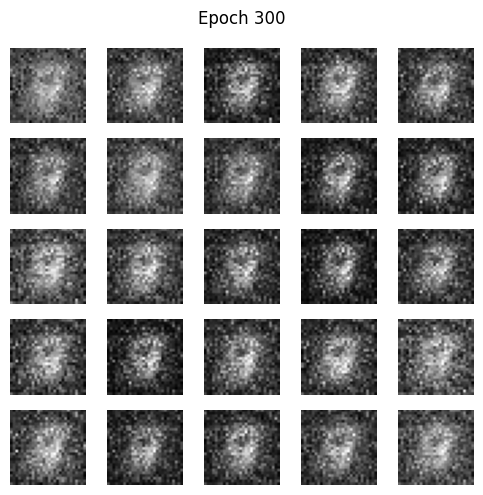

  301 [D loss: 0.1951, acc.: 50.00%] [G loss: 3.9801]
  302 [D loss: 0.1786, acc.: 50.00%] [G loss: 4.4898]
  303 [D loss: 0.1786, acc.: 50.00%] [G loss: 4.6389]
  304 [D loss: 0.2079, acc.: 50.00%] [G loss: 3.8018]
  305 [D loss: 0.2142, acc.: 50.00%] [G loss: 4.1889]
  306 [D loss: 0.1884, acc.: 50.00%] [G loss: 4.5147]
  307 [D loss: 0.1783, acc.: 50.00%] [G loss: 4.8676]
  308 [D loss: 0.1910, acc.: 50.00%] [G loss: 5.1012]
  309 [D loss: 0.1769, acc.: 50.00%] [G loss: 5.2138]
  310 [D loss: 0.2046, acc.: 50.00%] [G loss: 3.7294]
  311 [D loss: 0.1803, acc.: 50.00%] [G loss: 4.9872]
  312 [D loss: 0.1788, acc.: 50.00%] [G loss: 5.3335]
  313 [D loss: 0.1839, acc.: 50.00%] [G loss: 4.4988]
  314 [D loss: 0.1810, acc.: 50.00%] [G loss: 4.9341]
  315 [D loss: 0.1755, acc.: 50.00%] [G loss: 4.8678]
  316 [D loss: 0.1874, acc.: 50.00%] [G loss: 4.3295]
  317 [D loss: 0.1777, acc.: 50.00%] [G loss: 4.7555]
  318 [D loss: 0.1762, acc.: 50.00%] [G loss: 4.9583]
  319 [D loss: 0.1838, acc.:

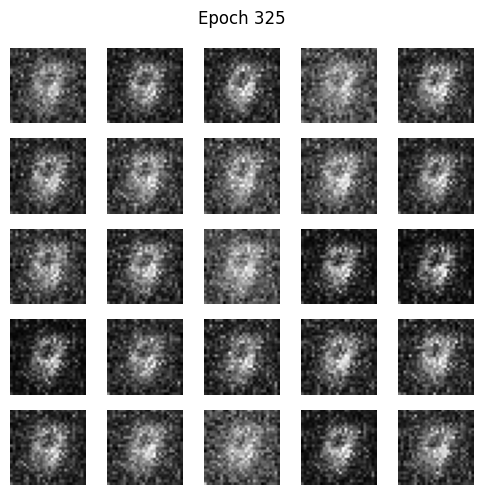

  326 [D loss: 0.1719, acc.: 50.00%] [G loss: 5.4924]
  327 [D loss: 0.2009, acc.: 50.00%] [G loss: 4.3404]
  328 [D loss: 0.1946, acc.: 50.00%] [G loss: 4.7945]
  329 [D loss: 0.1737, acc.: 50.00%] [G loss: 5.3585]
  330 [D loss: 0.1761, acc.: 50.00%] [G loss: 5.1061]
  331 [D loss: 0.1787, acc.: 50.00%] [G loss: 4.6352]
  332 [D loss: 0.1763, acc.: 50.00%] [G loss: 4.9606]
  333 [D loss: 0.1772, acc.: 50.00%] [G loss: 5.1173]
  334 [D loss: 0.1815, acc.: 50.00%] [G loss: 4.9895]
  335 [D loss: 0.1730, acc.: 50.00%] [G loss: 5.5570]
  336 [D loss: 0.2141, acc.: 50.00%] [G loss: 4.4629]
  337 [D loss: 0.1768, acc.: 50.00%] [G loss: 4.7795]
  338 [D loss: 0.1815, acc.: 50.00%] [G loss: 4.7170]
  339 [D loss: 0.1943, acc.: 50.00%] [G loss: 4.2021]
  340 [D loss: 0.1775, acc.: 50.00%] [G loss: 5.2762]
  341 [D loss: 0.1917, acc.: 50.00%] [G loss: 4.4863]
  342 [D loss: 0.1862, acc.: 50.00%] [G loss: 4.2415]
  343 [D loss: 0.1798, acc.: 50.00%] [G loss: 4.8831]
  344 [D loss: 0.1917, acc.:

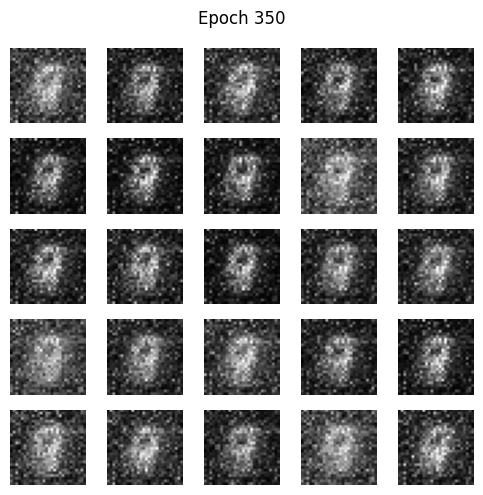

  351 [D loss: 0.1748, acc.: 50.00%] [G loss: 5.3176]
  352 [D loss: 1.2156, acc.: 4.00%] [G loss: 5.2331]
  353 [D loss: 0.1869, acc.: 50.00%] [G loss: 4.3062]
  354 [D loss: 0.1803, acc.: 50.00%] [G loss: 4.4154]
  355 [D loss: 0.1784, acc.: 50.00%] [G loss: 4.5412]
  356 [D loss: 0.1852, acc.: 50.00%] [G loss: 4.1397]
  357 [D loss: 0.1787, acc.: 50.00%] [G loss: 4.3821]
  358 [D loss: 0.2158, acc.: 50.00%] [G loss: 3.8676]
  359 [D loss: 0.1941, acc.: 50.00%] [G loss: 4.2120]
  360 [D loss: 0.1764, acc.: 50.00%] [G loss: 4.6053]
  361 [D loss: 0.1743, acc.: 50.00%] [G loss: 4.6459]
  362 [D loss: 0.1748, acc.: 50.00%] [G loss: 4.6711]
  363 [D loss: 0.1758, acc.: 50.00%] [G loss: 4.6775]
  364 [D loss: 0.1958, acc.: 50.00%] [G loss: 3.8806]
  365 [D loss: 0.2072, acc.: 50.00%] [G loss: 3.8293]
  366 [D loss: 0.2021, acc.: 50.00%] [G loss: 4.1086]
  367 [D loss: 0.1939, acc.: 50.00%] [G loss: 3.8695]
  368 [D loss: 0.1885, acc.: 50.00%] [G loss: 4.1507]
  369 [D loss: 0.1942, acc.: 

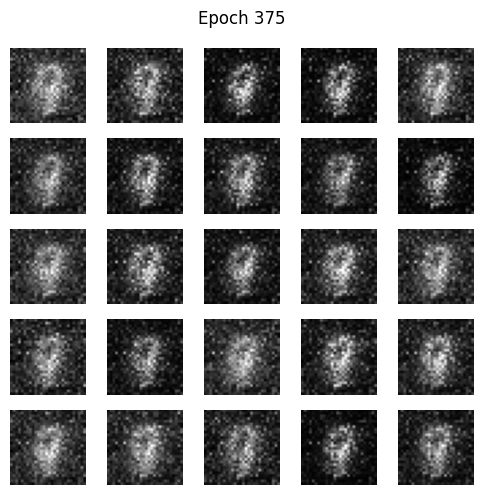

  376 [D loss: 0.1747, acc.: 50.00%] [G loss: 5.3910]
  377 [D loss: 0.2023, acc.: 50.00%] [G loss: 3.9406]
  378 [D loss: 0.1767, acc.: 50.00%] [G loss: 5.2631]
  379 [D loss: 0.1755, acc.: 50.00%] [G loss: 5.2399]
  380 [D loss: 0.1782, acc.: 50.00%] [G loss: 5.1273]
  381 [D loss: 0.1794, acc.: 50.00%] [G loss: 5.4850]
  382 [D loss: 0.1785, acc.: 50.00%] [G loss: 5.3914]
  383 [D loss: 0.1737, acc.: 50.00%] [G loss: 5.1467]
  384 [D loss: 0.1864, acc.: 50.00%] [G loss: 4.4793]
  385 [D loss: 0.1866, acc.: 50.00%] [G loss: 4.4653]
  386 [D loss: 0.1754, acc.: 50.00%] [G loss: 5.0189]
  387 [D loss: 0.1741, acc.: 50.00%] [G loss: 5.4733]
  388 [D loss: 0.1795, acc.: 50.00%] [G loss: 5.0537]
  389 [D loss: 0.1819, acc.: 50.00%] [G loss: 4.8326]
  390 [D loss: 0.1778, acc.: 50.00%] [G loss: 4.9639]
  391 [D loss: 0.1714, acc.: 50.00%] [G loss: 5.7594]
  392 [D loss: 0.1712, acc.: 50.00%] [G loss: 5.8350]
  393 [D loss: 0.1760, acc.: 50.00%] [G loss: 5.4910]
  394 [D loss: 0.1761, acc.:

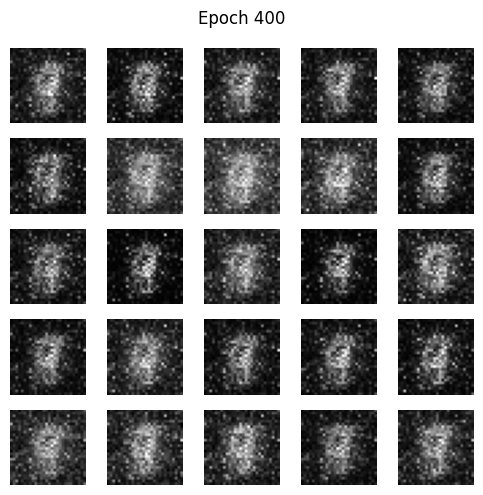

  401 [D loss: 0.1717, acc.: 50.00%] [G loss: 5.5039]
  402 [D loss: 0.1823, acc.: 50.00%] [G loss: 4.4156]
  403 [D loss: 0.1773, acc.: 50.00%] [G loss: 5.0557]
  404 [D loss: 0.1727, acc.: 50.00%] [G loss: 5.4036]
  405 [D loss: 0.1730, acc.: 50.00%] [G loss: 5.4169]
  406 [D loss: 0.1749, acc.: 50.00%] [G loss: 5.7445]
  407 [D loss: 0.1744, acc.: 50.00%] [G loss: 5.4748]
  408 [D loss: 0.1706, acc.: 50.00%] [G loss: 6.2453]
  409 [D loss: 0.1689, acc.: 50.00%] [G loss: 6.2557]
  410 [D loss: 0.1791, acc.: 50.00%] [G loss: 6.0560]
  411 [D loss: 0.1884, acc.: 50.00%] [G loss: 4.7534]
  412 [D loss: 0.1753, acc.: 50.00%] [G loss: 5.9301]
  413 [D loss: 0.1760, acc.: 50.00%] [G loss: 5.1136]
  414 [D loss: 0.1983, acc.: 50.00%] [G loss: 4.8716]
  415 [D loss: 0.1733, acc.: 50.00%] [G loss: 5.6876]
  416 [D loss: 0.2746, acc.: 48.00%] [G loss: 6.7754]
  417 [D loss: 0.1740, acc.: 50.00%] [G loss: 5.7722]
  418 [D loss: 0.1694, acc.: 50.00%] [G loss: 6.2117]
  419 [D loss: 0.1988, acc.:

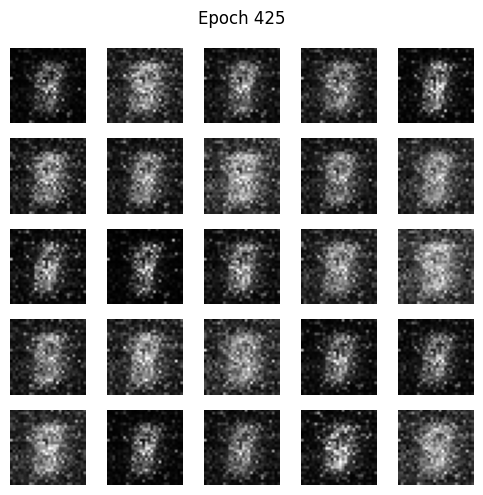

  426 [D loss: 0.1815, acc.: 50.00%] [G loss: 5.3745]
  427 [D loss: 0.1770, acc.: 50.00%] [G loss: 6.4008]
  428 [D loss: 0.1708, acc.: 50.00%] [G loss: 5.8637]
  429 [D loss: 0.1917, acc.: 50.00%] [G loss: 4.5946]
  430 [D loss: 0.1952, acc.: 50.00%] [G loss: 4.6574]
  431 [D loss: 0.1739, acc.: 50.00%] [G loss: 5.7498]
  432 [D loss: 0.1898, acc.: 50.00%] [G loss: 4.4245]
  433 [D loss: 0.1869, acc.: 50.00%] [G loss: 4.9810]
  434 [D loss: 0.1688, acc.: 50.00%] [G loss: 6.3155]
  435 [D loss: 0.1801, acc.: 50.00%] [G loss: 5.9858]
  436 [D loss: 0.1787, acc.: 50.00%] [G loss: 5.3565]
  437 [D loss: 0.2015, acc.: 50.00%] [G loss: 4.0061]
  438 [D loss: 0.2231, acc.: 50.00%] [G loss: 4.0028]
  439 [D loss: 0.2561, acc.: 50.00%] [G loss: 2.3851]
  440 [D loss: 0.2399, acc.: 50.00%] [G loss: 2.7069]
  441 [D loss: 0.2179, acc.: 50.00%] [G loss: 3.0862]
  442 [D loss: 0.2016, acc.: 50.00%] [G loss: 3.4387]
  443 [D loss: 0.2117, acc.: 50.00%] [G loss: 3.2493]
  444 [D loss: 0.2137, acc.:

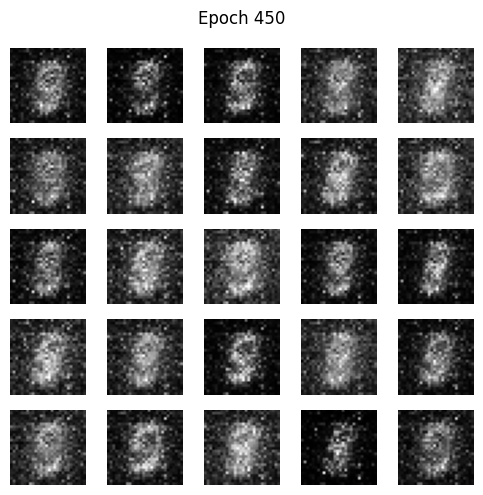

  451 [D loss: 0.2192, acc.: 50.00%] [G loss: 3.1087]
  452 [D loss: 0.1959, acc.: 50.00%] [G loss: 3.7370]
  453 [D loss: 0.1985, acc.: 50.00%] [G loss: 3.6619]
  454 [D loss: 0.1927, acc.: 50.00%] [G loss: 4.0493]
  455 [D loss: 0.2400, acc.: 50.00%] [G loss: 3.4055]
  456 [D loss: 0.2236, acc.: 50.00%] [G loss: 3.2683]
  457 [D loss: 0.2152, acc.: 50.00%] [G loss: 3.4879]
  458 [D loss: 0.2199, acc.: 50.00%] [G loss: 3.4746]
  459 [D loss: 0.2459, acc.: 50.00%] [G loss: 3.3653]
  460 [D loss: 0.2196, acc.: 50.00%] [G loss: 3.4015]
  461 [D loss: 0.2023, acc.: 50.00%] [G loss: 3.7821]
  462 [D loss: 0.2316, acc.: 50.00%] [G loss: 3.4660]
  463 [D loss: 0.2098, acc.: 50.00%] [G loss: 3.8129]
  464 [D loss: 0.2197, acc.: 50.00%] [G loss: 3.4141]
  465 [D loss: 0.2222, acc.: 50.00%] [G loss: 3.6802]
  466 [D loss: 0.2100, acc.: 50.00%] [G loss: 3.9011]
  467 [D loss: 0.2434, acc.: 50.00%] [G loss: 3.2867]
  468 [D loss: 0.1937, acc.: 50.00%] [G loss: 4.4355]
  469 [D loss: 0.1990, acc.:

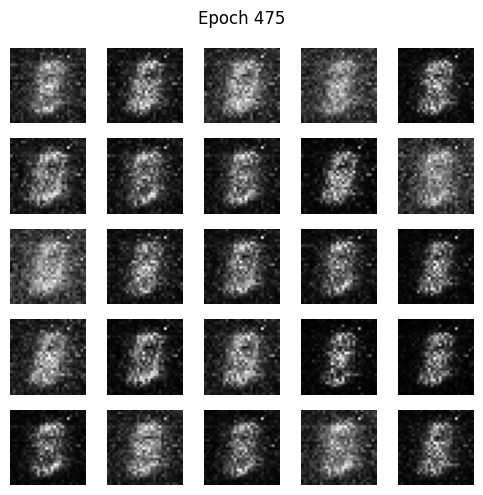

  476 [D loss: 0.2067, acc.: 50.00%] [G loss: 4.4636]
  477 [D loss: 0.2135, acc.: 50.00%] [G loss: 3.5606]
  478 [D loss: 0.2042, acc.: 50.00%] [G loss: 4.4188]
  479 [D loss: 0.1867, acc.: 50.00%] [G loss: 4.6612]
  480 [D loss: 0.2525, acc.: 50.00%] [G loss: 3.6459]
  481 [D loss: 0.2156, acc.: 50.00%] [G loss: 4.3139]
  482 [D loss: 0.2086, acc.: 50.00%] [G loss: 5.0981]
  483 [D loss: 0.1958, acc.: 50.00%] [G loss: 4.6497]
  484 [D loss: 0.1867, acc.: 50.00%] [G loss: 6.2046]
  485 [D loss: 0.1921, acc.: 50.00%] [G loss: 5.4796]
  486 [D loss: 0.1993, acc.: 50.00%] [G loss: 5.4806]
  487 [D loss: 0.1899, acc.: 50.00%] [G loss: 5.4423]
  488 [D loss: 0.1961, acc.: 50.00%] [G loss: 6.4241]
  489 [D loss: 0.1925, acc.: 50.00%] [G loss: 4.8455]
  490 [D loss: 0.1992, acc.: 50.00%] [G loss: 6.2000]
  491 [D loss: 0.1961, acc.: 50.00%] [G loss: 5.2425]
  492 [D loss: 0.2111, acc.: 50.00%] [G loss: 4.6976]
  493 [D loss: 0.2034, acc.: 50.00%] [G loss: 4.5561]
  494 [D loss: 0.2068, acc.:

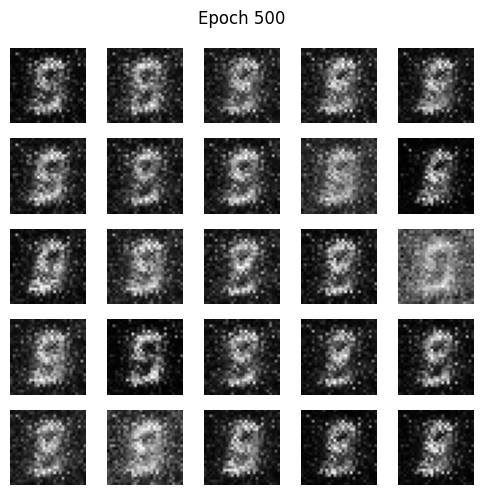

  501 [D loss: 0.2419, acc.: 50.00%] [G loss: 4.4599]
  502 [D loss: 0.2192, acc.: 50.00%] [G loss: 4.1111]
  503 [D loss: 0.2000, acc.: 50.00%] [G loss: 4.5018]
  504 [D loss: 0.1849, acc.: 50.00%] [G loss: 5.2819]
  505 [D loss: 0.2155, acc.: 50.00%] [G loss: 4.0394]
  506 [D loss: 0.1976, acc.: 50.00%] [G loss: 5.4680]
  507 [D loss: 0.2300, acc.: 50.00%] [G loss: 4.8655]
  508 [D loss: 0.1904, acc.: 50.00%] [G loss: 5.4051]
  509 [D loss: 0.1895, acc.: 50.00%] [G loss: 5.0718]
  510 [D loss: 0.2259, acc.: 50.00%] [G loss: 4.0025]
  511 [D loss: 0.1955, acc.: 50.00%] [G loss: 4.6656]
  512 [D loss: 0.1863, acc.: 50.00%] [G loss: 5.2955]
  513 [D loss: 0.1845, acc.: 50.00%] [G loss: 5.1809]
  514 [D loss: 0.1870, acc.: 50.00%] [G loss: 5.1667]
  515 [D loss: 0.1956, acc.: 50.00%] [G loss: 4.6255]
  516 [D loss: 0.1769, acc.: 50.00%] [G loss: 5.7390]
  517 [D loss: 0.2159, acc.: 50.00%] [G loss: 4.2913]
  518 [D loss: 0.1904, acc.: 50.00%] [G loss: 5.3817]
  519 [D loss: 0.1787, acc.:

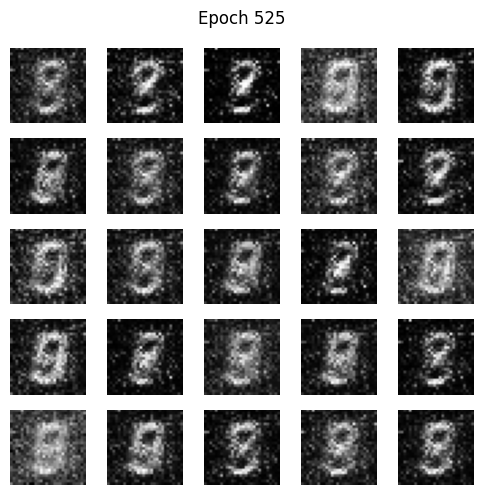

  526 [D loss: 0.2049, acc.: 50.00%] [G loss: 4.2967]
  527 [D loss: 0.1740, acc.: 50.00%] [G loss: 5.7473]
  528 [D loss: 0.1803, acc.: 50.00%] [G loss: 5.6148]
  529 [D loss: 0.2173, acc.: 50.00%] [G loss: 4.5440]
  530 [D loss: 0.2079, acc.: 50.00%] [G loss: 4.3527]
  531 [D loss: 0.2040, acc.: 50.00%] [G loss: 4.9007]
  532 [D loss: 0.1804, acc.: 50.00%] [G loss: 5.3846]
  533 [D loss: 0.1834, acc.: 50.00%] [G loss: 5.0383]
  534 [D loss: 0.1843, acc.: 50.00%] [G loss: 6.5339]
  535 [D loss: 0.1794, acc.: 50.00%] [G loss: 5.6048]
  536 [D loss: 0.1908, acc.: 50.00%] [G loss: 4.7335]
  537 [D loss: 0.1824, acc.: 50.00%] [G loss: 5.8495]
  538 [D loss: 0.1933, acc.: 50.00%] [G loss: 4.8531]
  539 [D loss: 0.1819, acc.: 50.00%] [G loss: 5.4578]
  540 [D loss: 0.1928, acc.: 50.00%] [G loss: 4.6834]
  541 [D loss: 0.2745, acc.: 50.00%] [G loss: 3.3497]
  542 [D loss: 0.1747, acc.: 50.00%] [G loss: 5.7524]
  543 [D loss: 0.1753, acc.: 50.00%] [G loss: 5.5830]
  544 [D loss: 0.2022, acc.:

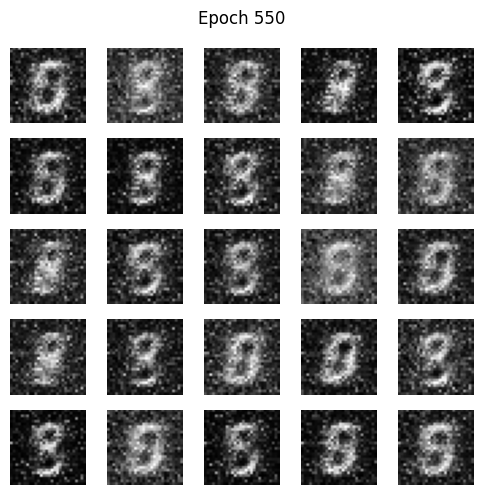

  551 [D loss: 0.1924, acc.: 50.00%] [G loss: 5.0783]
  552 [D loss: 0.1749, acc.: 50.00%] [G loss: 5.4132]
  553 [D loss: 0.1951, acc.: 50.00%] [G loss: 4.5051]
  554 [D loss: 0.2615, acc.: 50.00%] [G loss: 4.3663]
  555 [D loss: 0.1953, acc.: 50.00%] [G loss: 4.8362]
  556 [D loss: 0.1870, acc.: 50.00%] [G loss: 5.1280]
  557 [D loss: 0.1813, acc.: 50.00%] [G loss: 5.3446]
  558 [D loss: 0.1958, acc.: 50.00%] [G loss: 4.2271]
  559 [D loss: 0.1895, acc.: 50.00%] [G loss: 6.3922]
  560 [D loss: 0.1841, acc.: 50.00%] [G loss: 5.1289]
  561 [D loss: 0.1887, acc.: 50.00%] [G loss: 5.4367]
  562 [D loss: 0.1799, acc.: 50.00%] [G loss: 5.7837]
  563 [D loss: 0.1785, acc.: 50.00%] [G loss: 5.4094]
  564 [D loss: 0.1813, acc.: 50.00%] [G loss: 5.1607]
  565 [D loss: 0.1740, acc.: 50.00%] [G loss: 5.4180]
  566 [D loss: 0.1933, acc.: 50.00%] [G loss: 5.7550]
  567 [D loss: 0.1812, acc.: 50.00%] [G loss: 5.7713]
  568 [D loss: 0.1740, acc.: 50.00%] [G loss: 5.3443]
  569 [D loss: 0.1881, acc.:

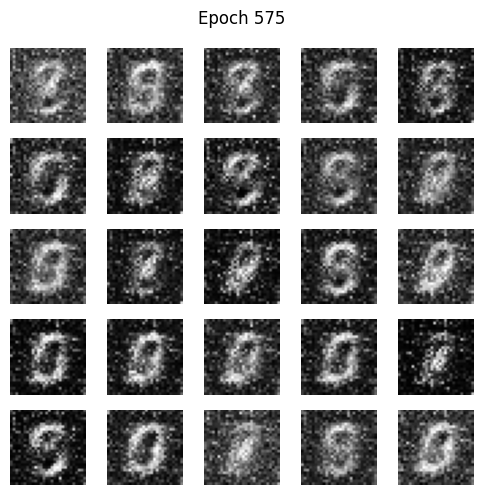

  576 [D loss: 0.1732, acc.: 50.00%] [G loss: 6.2518]
  577 [D loss: 0.1872, acc.: 50.00%] [G loss: 5.6378]
  578 [D loss: 0.1835, acc.: 50.00%] [G loss: 5.2133]
  579 [D loss: 0.1787, acc.: 50.00%] [G loss: 5.7936]
  580 [D loss: 0.1792, acc.: 50.00%] [G loss: 5.6111]
  581 [D loss: 0.1970, acc.: 50.00%] [G loss: 4.8152]
  582 [D loss: 0.1978, acc.: 50.00%] [G loss: 4.4533]
  583 [D loss: 0.1746, acc.: 50.00%] [G loss: 5.5342]
  584 [D loss: 0.1806, acc.: 50.00%] [G loss: 4.9893]
  585 [D loss: 0.1831, acc.: 50.00%] [G loss: 6.9278]
  586 [D loss: 0.1765, acc.: 50.00%] [G loss: 5.4871]
  587 [D loss: 0.1758, acc.: 50.00%] [G loss: 5.2755]
  588 [D loss: 0.1718, acc.: 50.00%] [G loss: 5.6176]
  589 [D loss: 0.1703, acc.: 50.00%] [G loss: 5.5999]
  590 [D loss: 0.1845, acc.: 50.00%] [G loss: 5.2305]
  591 [D loss: 0.1799, acc.: 50.00%] [G loss: 5.0962]
  592 [D loss: 0.1861, acc.: 50.00%] [G loss: 5.5525]
  593 [D loss: 0.1788, acc.: 50.00%] [G loss: 5.2182]
  594 [D loss: 0.1787, acc.:

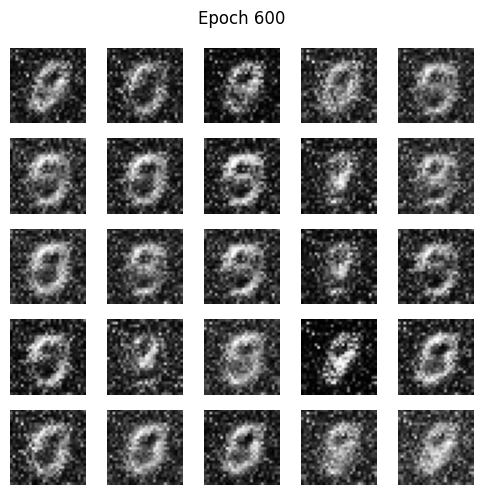

  601 [D loss: 0.2001, acc.: 50.00%] [G loss: 4.6951]
  602 [D loss: 0.1766, acc.: 50.00%] [G loss: 5.5048]
  603 [D loss: 0.1840, acc.: 50.00%] [G loss: 5.3674]
  604 [D loss: 0.1733, acc.: 50.00%] [G loss: 6.0801]
  605 [D loss: 0.1735, acc.: 50.00%] [G loss: 5.7531]
  606 [D loss: 0.1733, acc.: 50.00%] [G loss: 5.6729]
  607 [D loss: 0.1912, acc.: 50.00%] [G loss: 6.5143]
  608 [D loss: 0.1737, acc.: 50.00%] [G loss: 5.5684]
  609 [D loss: 0.1745, acc.: 50.00%] [G loss: 5.9847]
  610 [D loss: 0.1748, acc.: 50.00%] [G loss: 5.6040]
  611 [D loss: 0.1974, acc.: 50.00%] [G loss: 4.7313]
  612 [D loss: 0.1860, acc.: 50.00%] [G loss: 6.4990]
  613 [D loss: 0.1754, acc.: 50.00%] [G loss: 5.6467]
  614 [D loss: 0.1740, acc.: 50.00%] [G loss: 6.5905]
  615 [D loss: 0.1792, acc.: 50.00%] [G loss: 5.1271]
  616 [D loss: 0.1971, acc.: 50.00%] [G loss: 7.1142]
  617 [D loss: 0.1820, acc.: 50.00%] [G loss: 5.3750]
  618 [D loss: 0.1760, acc.: 50.00%] [G loss: 6.0274]
  619 [D loss: 0.1790, acc.:

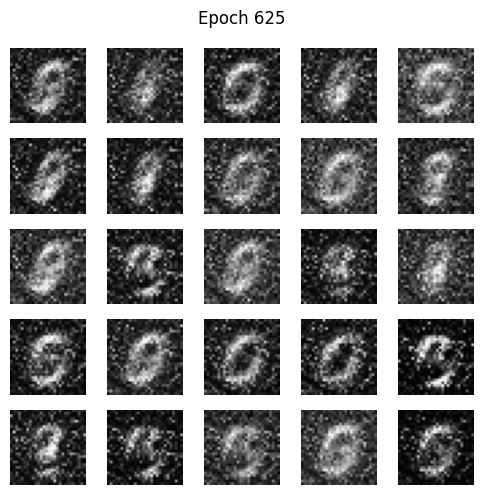

  626 [D loss: 0.2265, acc.: 49.00%] [G loss: 5.3629]
  627 [D loss: 0.1770, acc.: 50.00%] [G loss: 6.4224]
  628 [D loss: 0.2253, acc.: 50.00%] [G loss: 5.4407]
  629 [D loss: 0.1780, acc.: 50.00%] [G loss: 6.9011]
  630 [D loss: 0.1868, acc.: 50.00%] [G loss: 5.4194]
  631 [D loss: 0.1936, acc.: 50.00%] [G loss: 5.1594]
  632 [D loss: 0.1721, acc.: 50.00%] [G loss: 5.7758]
  633 [D loss: 0.1755, acc.: 50.00%] [G loss: 5.6289]
  634 [D loss: 0.1977, acc.: 50.00%] [G loss: 4.7945]
  635 [D loss: 0.1753, acc.: 50.00%] [G loss: 5.3232]
  636 [D loss: 0.1775, acc.: 50.00%] [G loss: 4.9191]
  637 [D loss: 0.1965, acc.: 50.00%] [G loss: 4.3988]
  638 [D loss: 0.1833, acc.: 50.00%] [G loss: 5.2987]
  639 [D loss: 0.1851, acc.: 50.00%] [G loss: 5.4133]
  640 [D loss: 0.1738, acc.: 50.00%] [G loss: 6.3694]
  641 [D loss: 0.1759, acc.: 50.00%] [G loss: 5.5381]
  642 [D loss: 0.1824, acc.: 50.00%] [G loss: 6.0034]
  643 [D loss: 0.1801, acc.: 50.00%] [G loss: 5.4530]
  644 [D loss: 0.1709, acc.:

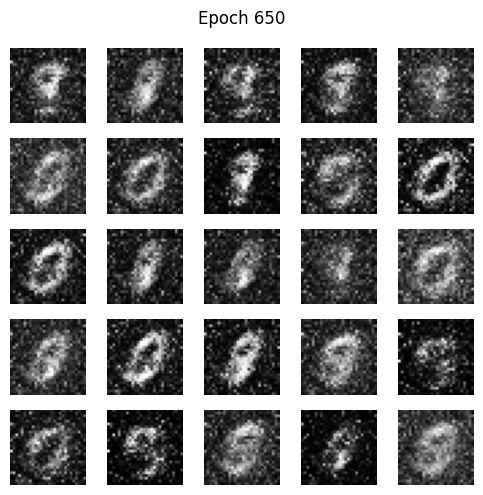

  651 [D loss: 0.1887, acc.: 50.00%] [G loss: 4.5273]
  652 [D loss: 0.2174, acc.: 50.00%] [G loss: 4.0975]
  653 [D loss: 0.1889, acc.: 50.00%] [G loss: 4.9857]
  654 [D loss: 0.1722, acc.: 50.00%] [G loss: 6.7708]
  655 [D loss: 0.1845, acc.: 50.00%] [G loss: 5.2504]
  656 [D loss: 0.1776, acc.: 50.00%] [G loss: 6.2479]
  657 [D loss: 0.1716, acc.: 50.00%] [G loss: 5.6407]
  658 [D loss: 0.1729, acc.: 50.00%] [G loss: 5.8713]
  659 [D loss: 0.1883, acc.: 50.00%] [G loss: 4.8546]
  660 [D loss: 0.1901, acc.: 50.00%] [G loss: 4.5233]
  661 [D loss: 0.3291, acc.: 50.00%] [G loss: 7.7623]
  662 [D loss: 0.1713, acc.: 50.00%] [G loss: 6.7051]
  663 [D loss: 0.1732, acc.: 50.00%] [G loss: 6.2079]
  664 [D loss: 0.1689, acc.: 50.00%] [G loss: 5.9111]
  665 [D loss: 0.1847, acc.: 50.00%] [G loss: 4.9229]
  666 [D loss: 0.1735, acc.: 50.00%] [G loss: 5.6967]
  667 [D loss: 0.1770, acc.: 50.00%] [G loss: 5.3857]
  668 [D loss: 0.1714, acc.: 50.00%] [G loss: 5.6953]
  669 [D loss: 0.2068, acc.:

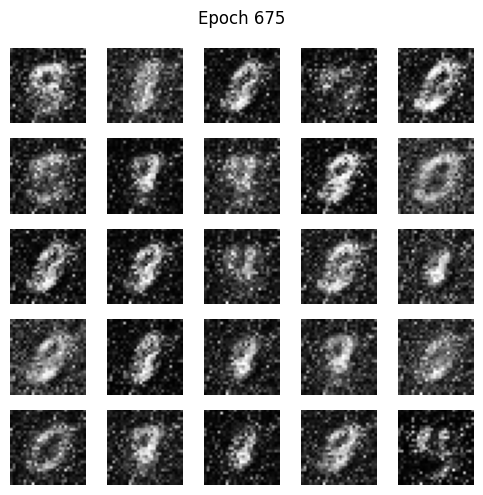

  676 [D loss: 0.1712, acc.: 50.00%] [G loss: 5.8992]
  677 [D loss: 0.1801, acc.: 50.00%] [G loss: 4.8850]
  678 [D loss: 0.1729, acc.: 50.00%] [G loss: 5.3708]
  679 [D loss: 0.1844, acc.: 50.00%] [G loss: 5.8164]
  680 [D loss: 0.1746, acc.: 50.00%] [G loss: 5.4599]
  681 [D loss: 0.1714, acc.: 50.00%] [G loss: 5.7103]
  682 [D loss: 0.1752, acc.: 50.00%] [G loss: 5.6896]
  683 [D loss: 0.1684, acc.: 50.00%] [G loss: 5.9882]
  684 [D loss: 0.1765, acc.: 50.00%] [G loss: 5.5816]
  685 [D loss: 0.1839, acc.: 50.00%] [G loss: 5.5112]
  686 [D loss: 0.1825, acc.: 50.00%] [G loss: 5.3726]
  687 [D loss: 0.1758, acc.: 50.00%] [G loss: 6.4345]
  688 [D loss: 0.1929, acc.: 50.00%] [G loss: 5.1192]
  689 [D loss: 0.1759, acc.: 50.00%] [G loss: 5.7554]
  690 [D loss: 0.2102, acc.: 50.00%] [G loss: 5.5340]
  691 [D loss: 0.1705, acc.: 50.00%] [G loss: 5.3525]
  692 [D loss: 0.1717, acc.: 50.00%] [G loss: 5.8019]
  693 [D loss: 0.1912, acc.: 50.00%] [G loss: 4.9208]
  694 [D loss: 0.1873, acc.:

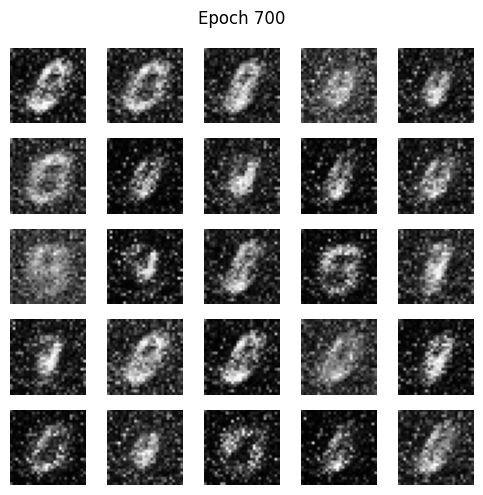

  701 [D loss: 0.1760, acc.: 50.00%] [G loss: 5.6038]
  702 [D loss: 0.1815, acc.: 50.00%] [G loss: 5.0946]
  703 [D loss: 0.1706, acc.: 50.00%] [G loss: 5.8832]
  704 [D loss: 0.1715, acc.: 50.00%] [G loss: 5.3354]
  705 [D loss: 0.1714, acc.: 50.00%] [G loss: 5.7879]
  706 [D loss: 0.1694, acc.: 50.00%] [G loss: 5.2977]
  707 [D loss: 0.1911, acc.: 50.00%] [G loss: 4.6258]
  708 [D loss: 0.1758, acc.: 50.00%] [G loss: 5.5576]
  709 [D loss: 0.1820, acc.: 50.00%] [G loss: 5.5027]
  710 [D loss: 0.1832, acc.: 50.00%] [G loss: 4.5148]
  711 [D loss: 0.1902, acc.: 50.00%] [G loss: 4.9816]
  712 [D loss: 0.1713, acc.: 50.00%] [G loss: 5.5369]
  713 [D loss: 0.1727, acc.: 50.00%] [G loss: 5.5529]
  714 [D loss: 0.1914, acc.: 50.00%] [G loss: 5.3518]
  715 [D loss: 0.1717, acc.: 50.00%] [G loss: 5.9917]
  716 [D loss: 0.1688, acc.: 50.00%] [G loss: 6.7160]
  717 [D loss: 0.1687, acc.: 50.00%] [G loss: 6.2705]
  718 [D loss: 0.1780, acc.: 50.00%] [G loss: 6.2078]
  719 [D loss: 0.1681, acc.:

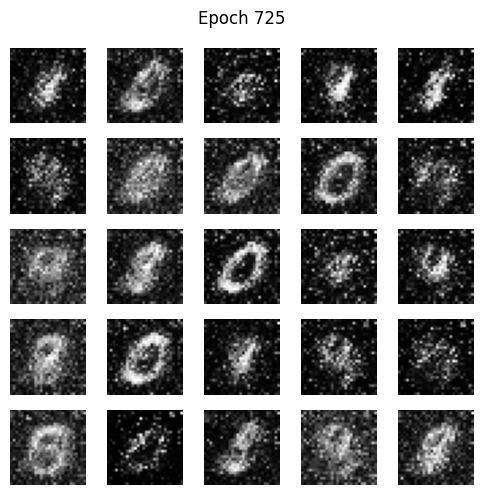

  726 [D loss: 0.1705, acc.: 50.00%] [G loss: 6.4106]
  727 [D loss: 0.1727, acc.: 50.00%] [G loss: 5.8159]
  728 [D loss: 0.2730, acc.: 50.00%] [G loss: 10.4198]
  729 [D loss: 0.1707, acc.: 50.00%] [G loss: 6.9043]
  730 [D loss: 0.1681, acc.: 50.00%] [G loss: 7.0570]
  731 [D loss: 0.1752, acc.: 50.00%] [G loss: 6.2972]
  732 [D loss: 0.1687, acc.: 50.00%] [G loss: 7.1177]
  733 [D loss: 0.1703, acc.: 50.00%] [G loss: 6.3838]
  734 [D loss: 0.1698, acc.: 50.00%] [G loss: 6.2171]
  735 [D loss: 0.1675, acc.: 50.00%] [G loss: 6.6884]
  736 [D loss: 0.1802, acc.: 50.00%] [G loss: 6.7320]
  737 [D loss: 0.1757, acc.: 50.00%] [G loss: 5.8361]
  738 [D loss: 0.1883, acc.: 50.00%] [G loss: 5.6074]
  739 [D loss: 0.1925, acc.: 50.00%] [G loss: 5.0440]
  740 [D loss: 0.1804, acc.: 50.00%] [G loss: 5.8664]
  741 [D loss: 0.1761, acc.: 50.00%] [G loss: 5.8726]
  742 [D loss: 0.1891, acc.: 50.00%] [G loss: 4.8343]
  743 [D loss: 0.1875, acc.: 50.00%] [G loss: 4.8014]
  744 [D loss: 0.1814, acc.

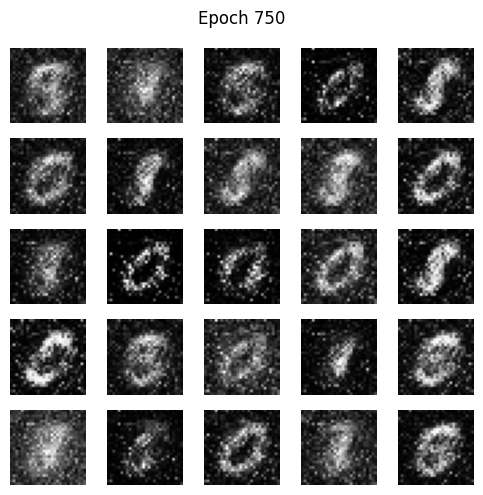

  751 [D loss: 0.1775, acc.: 50.00%] [G loss: 6.5298]
  752 [D loss: 0.1716, acc.: 50.00%] [G loss: 6.0944]
  753 [D loss: 0.1734, acc.: 50.00%] [G loss: 5.8447]
  754 [D loss: 0.1727, acc.: 50.00%] [G loss: 6.9679]
  755 [D loss: 0.3429, acc.: 47.00%] [G loss: 2.4712]
  756 [D loss: 0.2704, acc.: 50.00%] [G loss: 2.8470]
  757 [D loss: 0.2108, acc.: 50.00%] [G loss: 3.8428]
  758 [D loss: 0.1924, acc.: 50.00%] [G loss: 4.2816]
  759 [D loss: 0.1876, acc.: 50.00%] [G loss: 4.7742]
  760 [D loss: 0.1847, acc.: 50.00%] [G loss: 4.9052]
  761 [D loss: 0.1818, acc.: 50.00%] [G loss: 6.0482]
  762 [D loss: 0.1840, acc.: 50.00%] [G loss: 6.2333]
  763 [D loss: 0.2938, acc.: 50.00%] [G loss: 5.6964]
  764 [D loss: 0.2125, acc.: 50.00%] [G loss: 4.7769]
  765 [D loss: 0.2119, acc.: 50.00%] [G loss: 5.3911]
  766 [D loss: 0.2205, acc.: 50.00%] [G loss: 4.8720]
  767 [D loss: 0.2329, acc.: 50.00%] [G loss: 4.9795]
  768 [D loss: 0.2552, acc.: 50.00%] [G loss: 6.0236]
  769 [D loss: 0.2313, acc.:

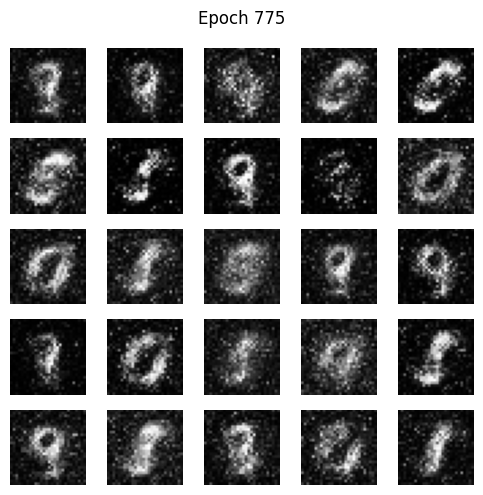

  776 [D loss: 0.1845, acc.: 50.00%] [G loss: 5.8752]
  777 [D loss: 0.1842, acc.: 50.00%] [G loss: 5.4740]
  778 [D loss: 0.1895, acc.: 50.00%] [G loss: 5.3833]
  779 [D loss: 0.3528, acc.: 50.00%] [G loss: 5.3276]
  780 [D loss: 0.2022, acc.: 50.00%] [G loss: 5.1746]
  781 [D loss: 0.1788, acc.: 50.00%] [G loss: 6.1577]
  782 [D loss: 0.1716, acc.: 50.00%] [G loss: 6.3606]
  783 [D loss: 0.2337, acc.: 50.00%] [G loss: 5.0879]
  784 [D loss: 0.2142, acc.: 50.00%] [G loss: 5.0144]
  785 [D loss: 0.1860, acc.: 50.00%] [G loss: 5.3458]
  786 [D loss: 0.1930, acc.: 50.00%] [G loss: 5.3926]
  787 [D loss: 0.1791, acc.: 50.00%] [G loss: 5.8591]
  788 [D loss: 0.1880, acc.: 50.00%] [G loss: 7.6063]
  789 [D loss: 0.2554, acc.: 50.00%] [G loss: 5.9906]
  790 [D loss: 0.1925, acc.: 50.00%] [G loss: 5.1059]
  791 [D loss: 0.1896, acc.: 50.00%] [G loss: 5.0473]
  792 [D loss: 0.1777, acc.: 50.00%] [G loss: 6.2156]
  793 [D loss: 0.1824, acc.: 50.00%] [G loss: 5.4569]
  794 [D loss: 0.1808, acc.:

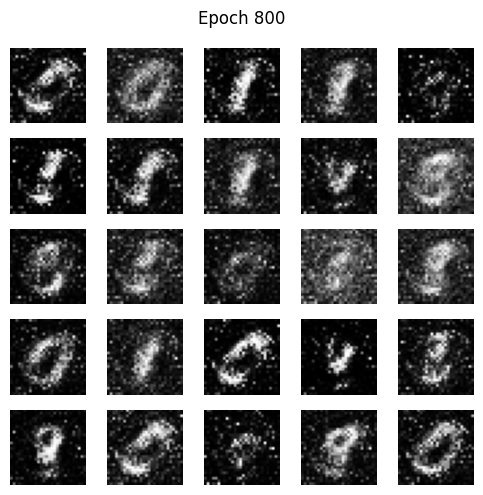

  801 [D loss: 0.1860, acc.: 50.00%] [G loss: 6.1374]
  802 [D loss: 0.1766, acc.: 50.00%] [G loss: 5.9912]
  803 [D loss: 0.1981, acc.: 50.00%] [G loss: 5.0817]
  804 [D loss: 0.1736, acc.: 50.00%] [G loss: 6.2014]
  805 [D loss: 0.2310, acc.: 50.00%] [G loss: 5.3155]
  806 [D loss: 0.3354, acc.: 45.00%] [G loss: 5.4345]
  807 [D loss: 0.1764, acc.: 50.00%] [G loss: 6.0174]
  808 [D loss: 0.1744, acc.: 50.00%] [G loss: 6.2287]
  809 [D loss: 0.1731, acc.: 50.00%] [G loss: 6.9678]
  810 [D loss: 0.1784, acc.: 50.00%] [G loss: 6.8649]
  811 [D loss: 0.1792, acc.: 50.00%] [G loss: 6.1483]
  812 [D loss: 0.1732, acc.: 50.00%] [G loss: 7.1268]
  813 [D loss: 0.1852, acc.: 50.00%] [G loss: 5.9061]
  814 [D loss: 0.1844, acc.: 50.00%] [G loss: 6.0381]
  815 [D loss: 0.1747, acc.: 50.00%] [G loss: 6.2180]
  816 [D loss: 0.1706, acc.: 50.00%] [G loss: 6.7314]
  817 [D loss: 0.1749, acc.: 50.00%] [G loss: 7.4650]
  818 [D loss: 0.1729, acc.: 50.00%] [G loss: 6.7924]
  819 [D loss: 0.1994, acc.:

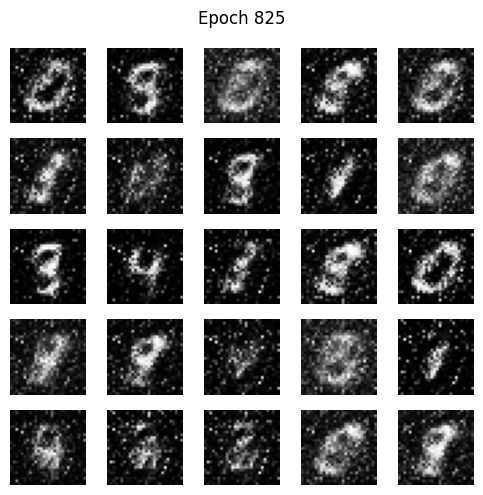

  826 [D loss: 0.1700, acc.: 50.00%] [G loss: 6.9066]
  827 [D loss: 0.1772, acc.: 50.00%] [G loss: 6.0769]
  828 [D loss: 0.1713, acc.: 50.00%] [G loss: 7.1296]
  829 [D loss: 0.1745, acc.: 50.00%] [G loss: 6.7124]
  830 [D loss: 0.2262, acc.: 50.00%] [G loss: 6.2111]
  831 [D loss: 0.1734, acc.: 50.00%] [G loss: 7.2882]
  832 [D loss: 0.1862, acc.: 50.00%] [G loss: 6.8844]
  833 [D loss: 0.1818, acc.: 50.00%] [G loss: 6.0062]
  834 [D loss: 0.1743, acc.: 50.00%] [G loss: 6.7693]
  835 [D loss: 0.4116, acc.: 40.00%] [G loss: 8.8671]
  836 [D loss: 0.1715, acc.: 50.00%] [G loss: 6.4468]
  837 [D loss: 0.1738, acc.: 50.00%] [G loss: 6.5081]
  838 [D loss: 0.1766, acc.: 50.00%] [G loss: 6.4228]
  839 [D loss: 0.1770, acc.: 50.00%] [G loss: 6.3116]
  840 [D loss: 0.1704, acc.: 50.00%] [G loss: 6.6572]
  841 [D loss: 0.1844, acc.: 50.00%] [G loss: 5.8700]
  842 [D loss: 0.1902, acc.: 50.00%] [G loss: 5.1928]
  843 [D loss: 0.1743, acc.: 50.00%] [G loss: 5.6297]
  844 [D loss: 0.1801, acc.:

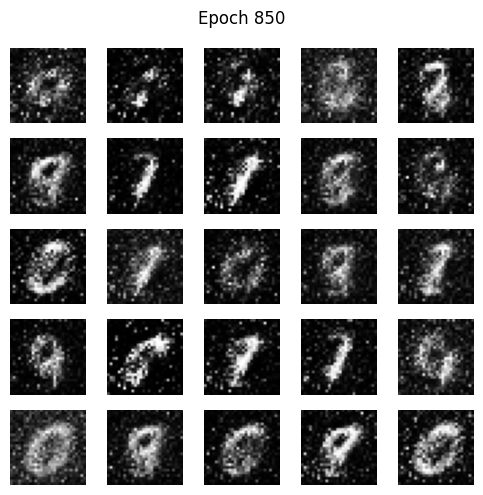

  851 [D loss: 0.1868, acc.: 50.00%] [G loss: 6.4241]
  852 [D loss: 0.1720, acc.: 50.00%] [G loss: 6.9552]
  853 [D loss: 0.1714, acc.: 50.00%] [G loss: 7.3410]
  854 [D loss: 0.1773, acc.: 50.00%] [G loss: 6.6709]
  855 [D loss: 0.1990, acc.: 50.00%] [G loss: 5.7911]
  856 [D loss: 0.1821, acc.: 50.00%] [G loss: 5.1509]
  857 [D loss: 0.1743, acc.: 50.00%] [G loss: 10.9002]
  858 [D loss: 0.2302, acc.: 50.00%] [G loss: 5.8467]
  859 [D loss: 0.1768, acc.: 50.00%] [G loss: 6.3985]
  860 [D loss: 0.1712, acc.: 50.00%] [G loss: 7.1350]
  861 [D loss: 0.1981, acc.: 50.00%] [G loss: 5.0402]
  862 [D loss: 0.2097, acc.: 50.00%] [G loss: 6.9270]
  863 [D loss: 0.2090, acc.: 50.00%] [G loss: 4.9537]
  864 [D loss: 0.1705, acc.: 50.00%] [G loss: 7.2827]
  865 [D loss: 0.1699, acc.: 50.00%] [G loss: 6.9367]
  866 [D loss: 0.1725, acc.: 50.00%] [G loss: 7.5994]
  867 [D loss: 0.1945, acc.: 49.00%] [G loss: 6.3107]
  868 [D loss: 0.2169, acc.: 50.00%] [G loss: 4.9508]
  869 [D loss: 0.1716, acc.

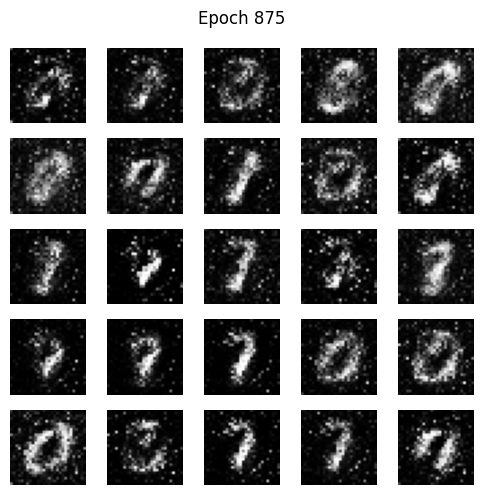

  876 [D loss: 0.4509, acc.: 46.00%] [G loss: 5.4415]
  877 [D loss: 0.1921, acc.: 50.00%] [G loss: 5.3876]
  878 [D loss: 0.1748, acc.: 50.00%] [G loss: 6.0677]
  879 [D loss: 0.1795, acc.: 50.00%] [G loss: 5.7135]
  880 [D loss: 0.1737, acc.: 50.00%] [G loss: 6.9649]
  881 [D loss: 0.1769, acc.: 50.00%] [G loss: 5.7211]
  882 [D loss: 0.1873, acc.: 50.00%] [G loss: 5.8633]
  883 [D loss: 0.1795, acc.: 50.00%] [G loss: 5.7661]
  884 [D loss: 0.1796, acc.: 50.00%] [G loss: 5.8859]
  885 [D loss: 0.1693, acc.: 50.00%] [G loss: 7.8076]
  886 [D loss: 0.1844, acc.: 50.00%] [G loss: 6.3924]
  887 [D loss: 0.1741, acc.: 50.00%] [G loss: 5.5525]
  888 [D loss: 0.1940, acc.: 50.00%] [G loss: 5.4952]
  889 [D loss: 0.1729, acc.: 50.00%] [G loss: 6.7476]
  890 [D loss: 0.1734, acc.: 50.00%] [G loss: 5.7009]
  891 [D loss: 0.2019, acc.: 50.00%] [G loss: 5.5218]
  892 [D loss: 0.1866, acc.: 50.00%] [G loss: 5.9001]
  893 [D loss: 0.1727, acc.: 50.00%] [G loss: 6.6777]
  894 [D loss: 0.3017, acc.:

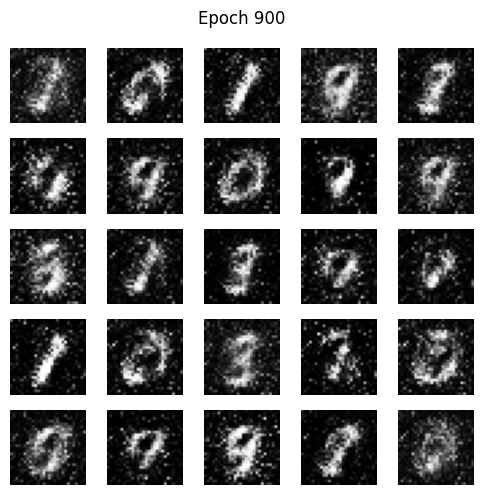

  901 [D loss: 0.1755, acc.: 50.00%] [G loss: 5.7116]
  902 [D loss: 0.1721, acc.: 50.00%] [G loss: 5.6476]
  903 [D loss: 0.1862, acc.: 50.00%] [G loss: 5.1264]
  904 [D loss: 0.1735, acc.: 50.00%] [G loss: 5.8347]
  905 [D loss: 0.1794, acc.: 50.00%] [G loss: 5.3742]
  906 [D loss: 0.1910, acc.: 50.00%] [G loss: 5.3015]
  907 [D loss: 0.2126, acc.: 50.00%] [G loss: 5.1884]
  908 [D loss: 0.1744, acc.: 50.00%] [G loss: 5.7970]
  909 [D loss: 0.1856, acc.: 50.00%] [G loss: 4.9836]
  910 [D loss: 0.1946, acc.: 50.00%] [G loss: 4.7705]
  911 [D loss: 0.2268, acc.: 49.00%] [G loss: 5.6201]
  912 [D loss: 0.1945, acc.: 50.00%] [G loss: 5.1459]
  913 [D loss: 0.1927, acc.: 50.00%] [G loss: 5.3286]
  914 [D loss: 0.2024, acc.: 49.00%] [G loss: 5.9992]
  915 [D loss: 0.1846, acc.: 50.00%] [G loss: 5.6656]
  916 [D loss: 0.1847, acc.: 50.00%] [G loss: 4.6253]
  917 [D loss: 0.1825, acc.: 50.00%] [G loss: 5.3594]
  918 [D loss: 0.1882, acc.: 50.00%] [G loss: 4.8466]
  919 [D loss: 0.1829, acc.:

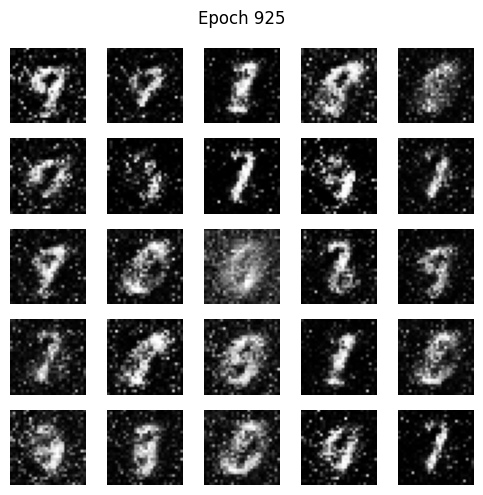

  926 [D loss: 0.1783, acc.: 50.00%] [G loss: 6.3928]
  927 [D loss: 0.1703, acc.: 50.00%] [G loss: 6.1830]
  928 [D loss: 0.2462, acc.: 47.00%] [G loss: 7.3010]
  929 [D loss: 0.1938, acc.: 50.00%] [G loss: 5.6740]
  930 [D loss: 0.1762, acc.: 50.00%] [G loss: 6.3316]
  931 [D loss: 0.1730, acc.: 50.00%] [G loss: 7.1145]
  932 [D loss: 0.1971, acc.: 50.00%] [G loss: 5.0684]
  933 [D loss: 0.1702, acc.: 50.00%] [G loss: 5.9430]
  934 [D loss: 0.1801, acc.: 50.00%] [G loss: 5.2161]
  935 [D loss: 0.1771, acc.: 50.00%] [G loss: 5.9818]
  936 [D loss: 0.1988, acc.: 50.00%] [G loss: 5.6959]
  937 [D loss: 0.1849, acc.: 50.00%] [G loss: 5.9181]
  938 [D loss: 0.1721, acc.: 50.00%] [G loss: 6.3614]
  939 [D loss: 0.1930, acc.: 50.00%] [G loss: 5.1471]
  940 [D loss: 0.2102, acc.: 50.00%] [G loss: 6.2165]
  941 [D loss: 0.1835, acc.: 50.00%] [G loss: 5.9635]
  942 [D loss: 0.1744, acc.: 50.00%] [G loss: 5.8851]
  943 [D loss: 0.1688, acc.: 50.00%] [G loss: 6.4846]
  944 [D loss: 0.1835, acc.:

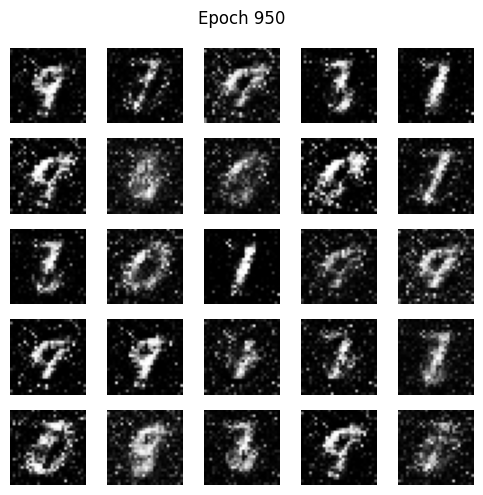

  951 [D loss: 0.1786, acc.: 50.00%] [G loss: 5.6902]
  952 [D loss: 0.1744, acc.: 50.00%] [G loss: 6.2195]
  953 [D loss: 0.1766, acc.: 50.00%] [G loss: 5.8280]
  954 [D loss: 0.1897, acc.: 50.00%] [G loss: 5.6916]
  955 [D loss: 0.1750, acc.: 50.00%] [G loss: 6.4042]
  956 [D loss: 0.1986, acc.: 50.00%] [G loss: 6.3967]
  957 [D loss: 0.1732, acc.: 50.00%] [G loss: 6.5541]
  958 [D loss: 0.1724, acc.: 50.00%] [G loss: 6.3086]
  959 [D loss: 0.1889, acc.: 50.00%] [G loss: 7.3275]
  960 [D loss: 0.1728, acc.: 50.00%] [G loss: 6.5369]
  961 [D loss: 0.1704, acc.: 50.00%] [G loss: 6.9081]
  962 [D loss: 0.1730, acc.: 50.00%] [G loss: 8.0093]
  963 [D loss: 0.1716, acc.: 50.00%] [G loss: 6.5992]
  964 [D loss: 0.1834, acc.: 50.00%] [G loss: 6.2890]
  965 [D loss: 0.1765, acc.: 50.00%] [G loss: 6.4606]
  966 [D loss: 0.1819, acc.: 50.00%] [G loss: 6.4088]
  967 [D loss: 0.1740, acc.: 50.00%] [G loss: 6.3147]
  968 [D loss: 0.1935, acc.: 50.00%] [G loss: 5.9140]
  969 [D loss: 0.1796, acc.:

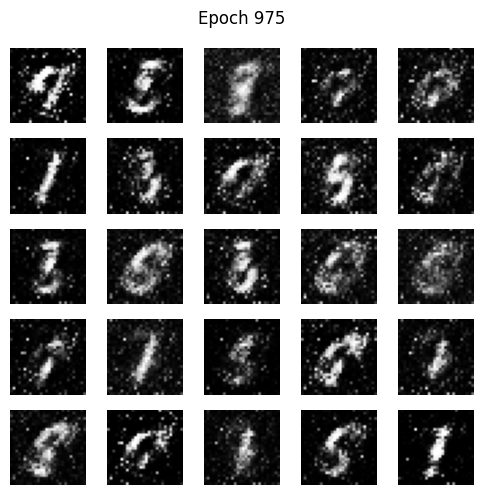

  976 [D loss: 0.1773, acc.: 50.00%] [G loss: 7.0194]
  977 [D loss: 0.2140, acc.: 50.00%] [G loss: 5.0107]
  978 [D loss: 0.1789, acc.: 50.00%] [G loss: 6.4631]
  979 [D loss: 0.1701, acc.: 50.00%] [G loss: 6.3064]
  980 [D loss: 0.1891, acc.: 50.00%] [G loss: 5.9425]
  981 [D loss: 0.1772, acc.: 50.00%] [G loss: 6.4138]
  982 [D loss: 0.1733, acc.: 50.00%] [G loss: 6.4719]
  983 [D loss: 0.2780, acc.: 50.00%] [G loss: 6.3600]
  984 [D loss: 0.1831, acc.: 50.00%] [G loss: 5.8468]
  985 [D loss: 0.1676, acc.: 50.00%] [G loss: 7.0916]
  986 [D loss: 0.1747, acc.: 50.00%] [G loss: 6.5914]
  987 [D loss: 0.1693, acc.: 50.00%] [G loss: 7.2745]
  988 [D loss: 0.1728, acc.: 50.00%] [G loss: 6.8000]
  989 [D loss: 0.1937, acc.: 50.00%] [G loss: 6.2105]
  990 [D loss: 0.1731, acc.: 50.00%] [G loss: 7.0761]
  991 [D loss: 0.1701, acc.: 50.00%] [G loss: 6.8667]
  992 [D loss: 0.2152, acc.: 50.00%] [G loss: 5.3823]
  993 [D loss: 0.1819, acc.: 50.00%] [G loss: 6.2391]
  994 [D loss: 0.3292, acc.:

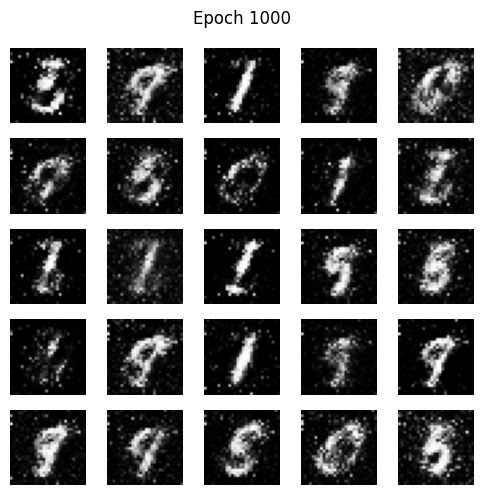

In [41]:
# ------------------
# Start training
# ------------------
train(epochs=1000, batch_size=100, print_interval=1, sample_interval=25)


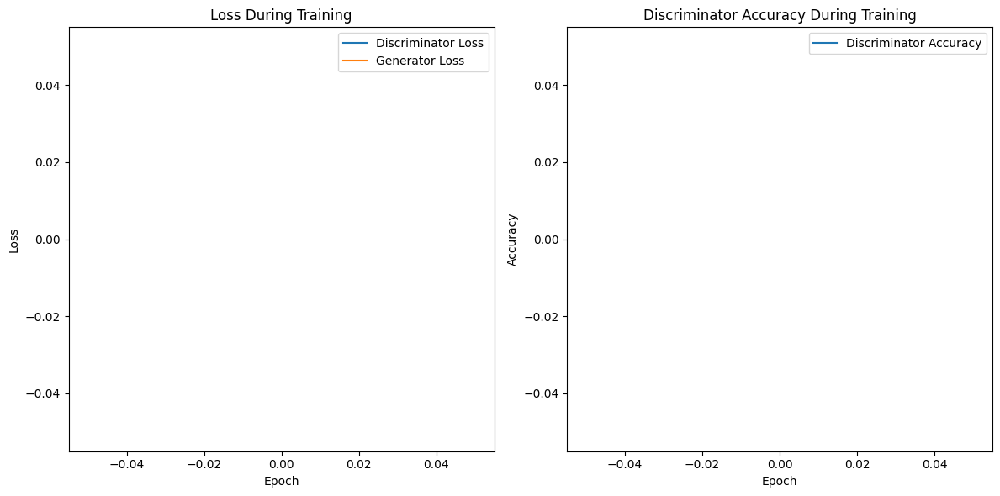

In [44]:
plot_training_progress()

In [43]:
# Save the generator model
generator.save("generator_model_v1.h5")

# Save the discriminator model
discriminator.save("discriminator_model_v1.h5")

In [45]:
from tensorflow.keras.models import load_model

# Load the saved generator and discriminator
generator = load_model("generator_model_v1.h5")
discriminator = load_model("discriminator_model_v1.h5")

In [46]:
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model

# Freeze the discriminator's weights
discriminator.trainable = False

# Rebuild the combined model
z = Input(shape=(latent_dim,))
img = generator(z)
valid = discriminator(img)
combined = Model(z, valid, name="GAN")

# Compile the combined model with the generator's optimizer
opt_g = Adam(2e-4, beta_1=0.5)  # Use the same optimizer as before
combined.compile(loss="binary_crossentropy", optimizer=opt_g)

    1 [D loss: 0.1962, acc.: 50.00%] [G loss: 6.1425]
1/1 [==============================] - 0s 35ms/step


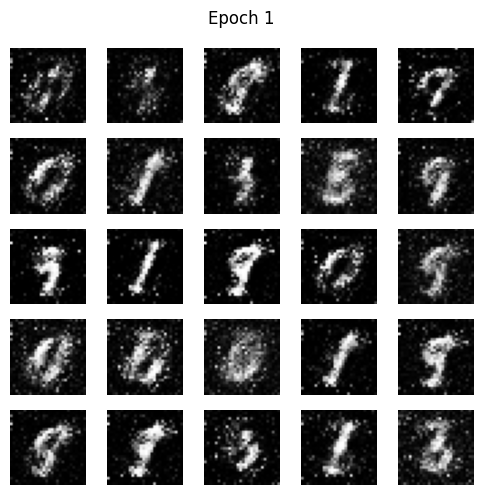

    2 [D loss: 0.2006, acc.: 50.00%] [G loss: 5.8524]
    3 [D loss: 0.1756, acc.: 50.00%] [G loss: 4.8409]
    4 [D loss: 0.1962, acc.: 50.00%] [G loss: 4.8786]
    5 [D loss: 0.1963, acc.: 50.00%] [G loss: 4.1250]
    6 [D loss: 0.2195, acc.: 50.00%] [G loss: 3.6832]
    7 [D loss: 0.2399, acc.: 49.00%] [G loss: 2.9755]
    8 [D loss: 0.3081, acc.: 47.00%] [G loss: 2.5229]
    9 [D loss: 0.3855, acc.: 40.00%] [G loss: 2.0857]
   10 [D loss: 0.4987, acc.: 30.00%] [G loss: 1.2638]
   11 [D loss: 0.5893, acc.: 25.00%] [G loss: 0.9818]
   12 [D loss: 0.6531, acc.: 23.00%] [G loss: 0.8222]
   13 [D loss: 0.7712, acc.: 15.00%] [G loss: 0.6205]
   14 [D loss: 0.8085, acc.: 10.00%] [G loss: 0.5397]
   15 [D loss: 0.8726, acc.: 13.00%] [G loss: 0.3964]
   16 [D loss: 1.0744, acc.: 3.00%] [G loss: 0.3140]
   17 [D loss: 1.1173, acc.: 4.00%] [G loss: 0.2018]
   18 [D loss: 1.1683, acc.: 1.00%] [G loss: 0.2488]
   19 [D loss: 1.2048, acc.: 2.00%] [G loss: 0.1954]
   20 [D loss: 1.1593, acc.: 0.0

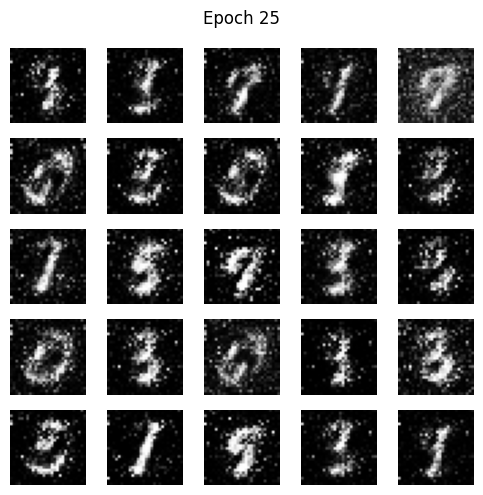

   26 [D loss: 1.4079, acc.: 0.00%] [G loss: 0.1078]
   27 [D loss: 1.4485, acc.: 1.00%] [G loss: 0.1291]
   28 [D loss: 1.4100, acc.: 0.00%] [G loss: 0.1087]
   29 [D loss: 1.4190, acc.: 0.00%] [G loss: 0.1032]
   30 [D loss: 1.4430, acc.: 0.00%] [G loss: 0.0947]
   31 [D loss: 1.4084, acc.: 0.00%] [G loss: 0.0941]
   32 [D loss: 1.4652, acc.: 1.00%] [G loss: 0.1197]
   33 [D loss: 1.4818, acc.: 0.00%] [G loss: 0.0812]
   34 [D loss: 1.5502, acc.: 0.00%] [G loss: 0.0903]
   35 [D loss: 1.5018, acc.: 0.00%] [G loss: 0.0906]
   36 [D loss: 1.5113, acc.: 0.00%] [G loss: 0.0803]
   37 [D loss: 1.5750, acc.: 0.00%] [G loss: 0.0770]
   38 [D loss: 1.5054, acc.: 1.00%] [G loss: 0.0781]
   39 [D loss: 1.5995, acc.: 0.00%] [G loss: 0.0799]
   40 [D loss: 1.6233, acc.: 0.00%] [G loss: 0.0778]
   41 [D loss: 1.5660, acc.: 0.00%] [G loss: 0.0746]
   42 [D loss: 1.5525, acc.: 0.00%] [G loss: 0.0695]
   43 [D loss: 1.6487, acc.: 0.00%] [G loss: 0.0693]
   44 [D loss: 1.6295, acc.: 0.00%] [G loss: 0

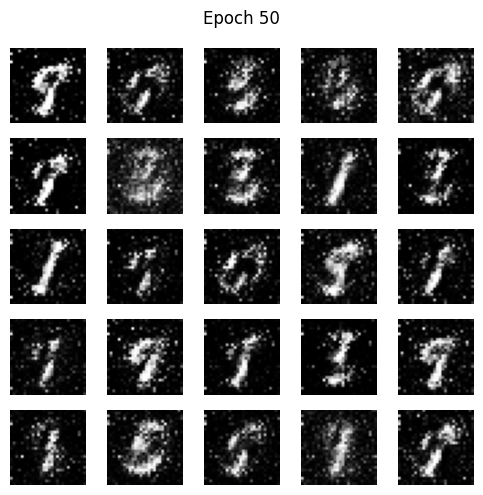

   51 [D loss: 1.7170, acc.: 0.00%] [G loss: 0.0518]
   52 [D loss: 1.6972, acc.: 0.00%] [G loss: 0.0536]
   53 [D loss: 1.7233, acc.: 0.00%] [G loss: 0.0464]
   54 [D loss: 1.7288, acc.: 1.00%] [G loss: 0.0529]
   55 [D loss: 1.7389, acc.: 0.00%] [G loss: 0.0555]
   56 [D loss: 1.7639, acc.: 0.00%] [G loss: 0.0519]
   57 [D loss: 1.7204, acc.: 0.00%] [G loss: 0.0443]
   58 [D loss: 1.8049, acc.: 0.00%] [G loss: 0.0431]
   59 [D loss: 1.7564, acc.: 0.00%] [G loss: 0.0478]
   60 [D loss: 1.8180, acc.: 0.00%] [G loss: 0.0468]
   61 [D loss: 1.7815, acc.: 0.00%] [G loss: 0.0407]
   62 [D loss: 1.8245, acc.: 0.00%] [G loss: 0.0447]
   63 [D loss: 1.7659, acc.: 0.00%] [G loss: 0.0459]
   64 [D loss: 1.8351, acc.: 0.00%] [G loss: 0.0385]
   65 [D loss: 1.8271, acc.: 0.00%] [G loss: 0.0417]
   66 [D loss: 1.8623, acc.: 0.00%] [G loss: 0.0414]
   67 [D loss: 1.9059, acc.: 0.00%] [G loss: 0.0370]
   68 [D loss: 1.8130, acc.: 0.00%] [G loss: 0.0350]
   69 [D loss: 1.8393, acc.: 0.00%] [G loss: 0

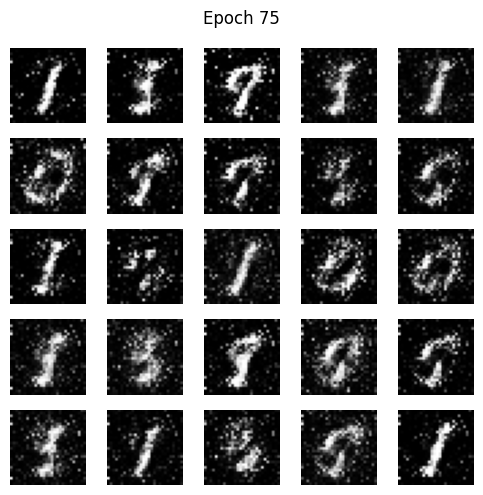

   76 [D loss: 1.9673, acc.: 0.00%] [G loss: 0.0297]
   77 [D loss: 1.8690, acc.: 0.00%] [G loss: 0.0316]
   78 [D loss: 1.9405, acc.: 0.00%] [G loss: 0.0325]
   79 [D loss: 1.9668, acc.: 0.00%] [G loss: 0.0344]
   80 [D loss: 2.0157, acc.: 0.00%] [G loss: 0.0299]
   81 [D loss: 2.0423, acc.: 0.00%] [G loss: 0.0293]
   82 [D loss: 2.0609, acc.: 0.00%] [G loss: 0.0295]
   83 [D loss: 2.0349, acc.: 0.00%] [G loss: 0.0268]
   84 [D loss: 2.0395, acc.: 0.00%] [G loss: 0.0257]
   85 [D loss: 2.0841, acc.: 0.00%] [G loss: 0.0245]
   86 [D loss: 1.9929, acc.: 0.00%] [G loss: 0.0245]
   87 [D loss: 2.0989, acc.: 0.00%] [G loss: 0.0261]
   88 [D loss: 2.0655, acc.: 0.00%] [G loss: 0.0254]
   89 [D loss: 2.0911, acc.: 0.00%] [G loss: 0.0208]
   90 [D loss: 2.1403, acc.: 0.00%] [G loss: 0.0243]
   91 [D loss: 2.1180, acc.: 0.00%] [G loss: 0.0244]
   92 [D loss: 2.2102, acc.: 0.00%] [G loss: 0.0283]
   93 [D loss: 2.1670, acc.: 0.00%] [G loss: 0.0231]
   94 [D loss: 2.2798, acc.: 0.00%] [G loss: 0

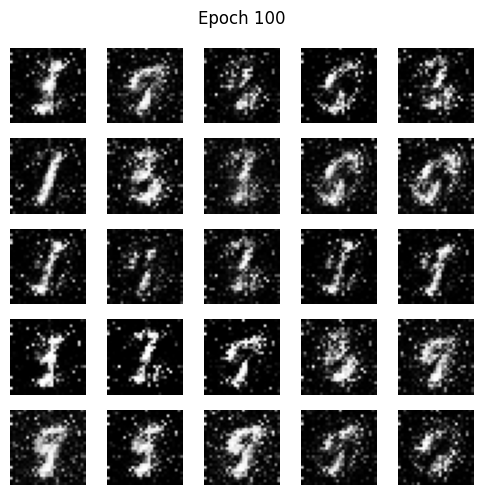

  101 [D loss: 2.2569, acc.: 0.00%] [G loss: 0.0184]
  102 [D loss: 2.1564, acc.: 0.00%] [G loss: 0.0189]
  103 [D loss: 2.2624, acc.: 0.00%] [G loss: 0.0197]
  104 [D loss: 2.2079, acc.: 0.00%] [G loss: 0.0170]
  105 [D loss: 2.3100, acc.: 0.00%] [G loss: 0.0167]
  106 [D loss: 2.2615, acc.: 0.00%] [G loss: 0.0176]
  107 [D loss: 2.2901, acc.: 0.00%] [G loss: 0.0169]
  108 [D loss: 2.2598, acc.: 0.00%] [G loss: 0.0164]
  109 [D loss: 2.3285, acc.: 0.00%] [G loss: 0.0159]
  110 [D loss: 2.4170, acc.: 0.00%] [G loss: 0.0161]
  111 [D loss: 2.2431, acc.: 0.00%] [G loss: 0.0170]
  112 [D loss: 2.3852, acc.: 0.00%] [G loss: 0.0155]
  113 [D loss: 2.3302, acc.: 0.00%] [G loss: 0.0143]
  114 [D loss: 2.3333, acc.: 0.00%] [G loss: 0.0160]
  115 [D loss: 2.3460, acc.: 0.00%] [G loss: 0.0155]
  116 [D loss: 2.3394, acc.: 0.00%] [G loss: 0.0147]
  117 [D loss: 2.3784, acc.: 0.00%] [G loss: 0.0155]
  118 [D loss: 2.4536, acc.: 0.00%] [G loss: 0.0138]
  119 [D loss: 2.4470, acc.: 0.00%] [G loss: 0

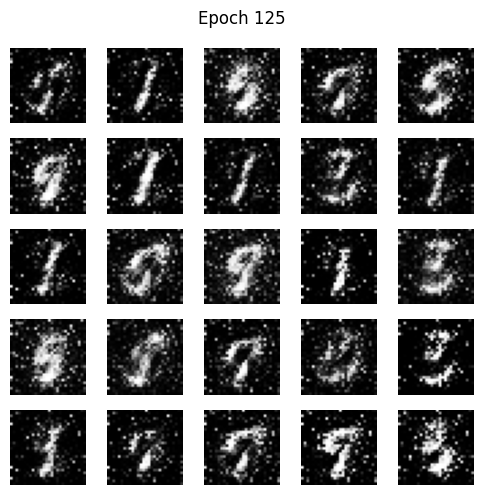

  126 [D loss: 2.4451, acc.: 0.00%] [G loss: 0.0125]
  127 [D loss: 2.5098, acc.: 0.00%] [G loss: 0.0120]
  128 [D loss: 2.4436, acc.: 0.00%] [G loss: 0.0108]
  129 [D loss: 2.5841, acc.: 0.00%] [G loss: 0.0115]
  130 [D loss: 2.5003, acc.: 0.00%] [G loss: 0.0110]
  131 [D loss: 2.4780, acc.: 0.00%] [G loss: 0.0127]
  132 [D loss: 2.4593, acc.: 0.00%] [G loss: 0.0119]
  133 [D loss: 2.5686, acc.: 0.00%] [G loss: 0.0123]
  134 [D loss: 2.5063, acc.: 0.00%] [G loss: 0.0120]
  135 [D loss: 2.4954, acc.: 0.00%] [G loss: 0.0110]
  136 [D loss: 2.5527, acc.: 0.00%] [G loss: 0.0110]
  137 [D loss: 2.5531, acc.: 0.00%] [G loss: 0.0103]
  138 [D loss: 2.5561, acc.: 0.00%] [G loss: 0.0106]
  139 [D loss: 2.5711, acc.: 0.00%] [G loss: 0.0101]
  140 [D loss: 2.5113, acc.: 0.00%] [G loss: 0.0101]
  141 [D loss: 2.6250, acc.: 0.00%] [G loss: 0.0095]
  142 [D loss: 2.6029, acc.: 0.00%] [G loss: 0.0096]
  143 [D loss: 2.6218, acc.: 0.00%] [G loss: 0.0092]
  144 [D loss: 2.5958, acc.: 0.00%] [G loss: 0

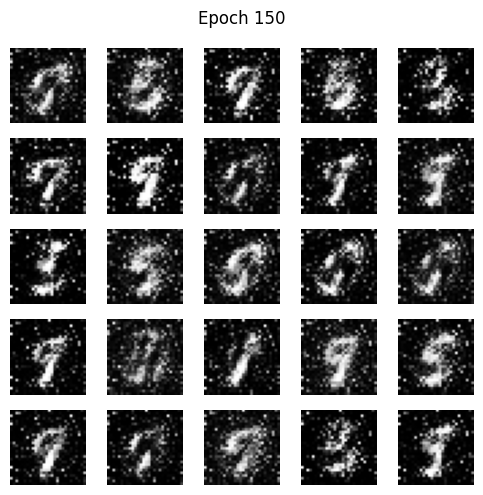

  151 [D loss: 2.6507, acc.: 0.00%] [G loss: 0.0083]
  152 [D loss: 2.5629, acc.: 0.00%] [G loss: 0.0085]
  153 [D loss: 2.6761, acc.: 0.00%] [G loss: 0.0083]
  154 [D loss: 2.6814, acc.: 0.00%] [G loss: 0.0082]
  155 [D loss: 2.6656, acc.: 0.00%] [G loss: 0.0077]
  156 [D loss: 2.6843, acc.: 0.00%] [G loss: 0.0081]
  157 [D loss: 2.6774, acc.: 0.00%] [G loss: 0.0077]
  158 [D loss: 2.6659, acc.: 0.00%] [G loss: 0.0083]
  159 [D loss: 2.7248, acc.: 0.00%] [G loss: 0.0082]
  160 [D loss: 2.6743, acc.: 0.00%] [G loss: 0.0091]
  161 [D loss: 2.6178, acc.: 0.00%] [G loss: 0.0081]
  162 [D loss: 2.6558, acc.: 0.00%] [G loss: 0.0082]
  163 [D loss: 2.7114, acc.: 0.00%] [G loss: 0.0084]
  164 [D loss: 2.7680, acc.: 0.00%] [G loss: 0.0080]
  165 [D loss: 2.7560, acc.: 0.00%] [G loss: 0.0070]
  166 [D loss: 2.6925, acc.: 0.00%] [G loss: 0.0076]
  167 [D loss: 2.7151, acc.: 0.00%] [G loss: 0.0069]
  168 [D loss: 2.7316, acc.: 0.00%] [G loss: 0.0070]
  169 [D loss: 2.7951, acc.: 0.00%] [G loss: 0

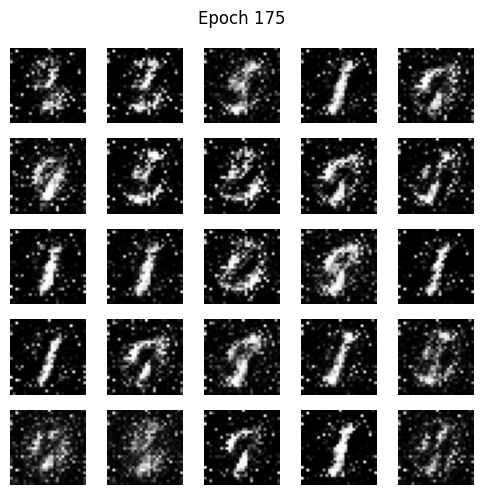

  176 [D loss: 2.7524, acc.: 0.00%] [G loss: 0.0071]
  177 [D loss: 2.7980, acc.: 0.00%] [G loss: 0.0068]
  178 [D loss: 2.7265, acc.: 0.00%] [G loss: 0.0066]
  179 [D loss: 2.8813, acc.: 0.00%] [G loss: 0.0069]
  180 [D loss: 2.8005, acc.: 0.00%] [G loss: 0.0063]
  181 [D loss: 2.8106, acc.: 0.00%] [G loss: 0.0050]
  182 [D loss: 2.7590, acc.: 0.00%] [G loss: 0.0057]
  183 [D loss: 2.8178, acc.: 0.00%] [G loss: 0.0091]
  184 [D loss: 2.8093, acc.: 0.00%] [G loss: 0.0063]
  185 [D loss: 2.7958, acc.: 0.00%] [G loss: 0.0060]
  186 [D loss: 2.8543, acc.: 0.00%] [G loss: 0.0060]
  187 [D loss: 2.8993, acc.: 0.00%] [G loss: 0.0063]
  188 [D loss: 2.8514, acc.: 0.00%] [G loss: 0.0057]
  189 [D loss: 2.8506, acc.: 0.00%] [G loss: 0.0050]
  190 [D loss: 2.9079, acc.: 0.00%] [G loss: 0.0053]
  191 [D loss: 2.8619, acc.: 0.00%] [G loss: 0.0059]
  192 [D loss: 2.8300, acc.: 0.00%] [G loss: 0.0051]
  193 [D loss: 2.7934, acc.: 0.00%] [G loss: 0.0054]
  194 [D loss: 2.8378, acc.: 0.00%] [G loss: 0

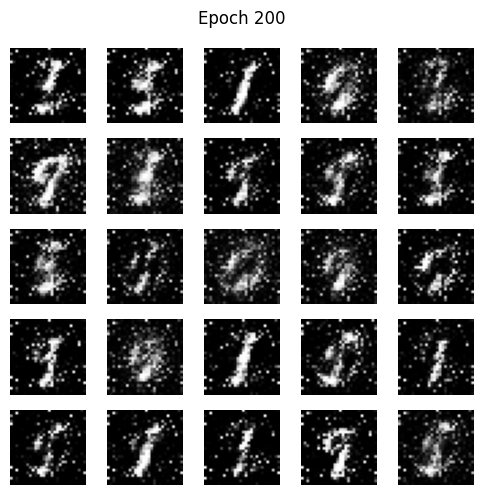

  201 [D loss: 2.8962, acc.: 0.00%] [G loss: 0.0048]
  202 [D loss: 3.0161, acc.: 0.00%] [G loss: 0.0058]
  203 [D loss: 2.9649, acc.: 0.00%] [G loss: 0.0050]
  204 [D loss: 2.8570, acc.: 0.00%] [G loss: 0.0046]
  205 [D loss: 2.8598, acc.: 0.00%] [G loss: 0.0046]
  206 [D loss: 2.9120, acc.: 0.00%] [G loss: 0.0050]
  207 [D loss: 2.8629, acc.: 0.00%] [G loss: 0.0045]
  208 [D loss: 2.9582, acc.: 0.00%] [G loss: 0.0048]
  209 [D loss: 2.9767, acc.: 0.00%] [G loss: 0.0047]
  210 [D loss: 2.9142, acc.: 0.00%] [G loss: 0.0050]
  211 [D loss: 3.0313, acc.: 0.00%] [G loss: 0.0045]
  212 [D loss: 2.9874, acc.: 0.00%] [G loss: 0.0051]
  213 [D loss: 2.9555, acc.: 0.00%] [G loss: 0.0050]
  214 [D loss: 2.9129, acc.: 0.00%] [G loss: 0.0045]
  215 [D loss: 2.9196, acc.: 0.00%] [G loss: 0.0047]
  216 [D loss: 2.9278, acc.: 0.00%] [G loss: 0.0051]
  217 [D loss: 2.9991, acc.: 0.00%] [G loss: 0.0044]
  218 [D loss: 3.0538, acc.: 0.00%] [G loss: 0.0045]
  219 [D loss: 3.0150, acc.: 0.00%] [G loss: 0

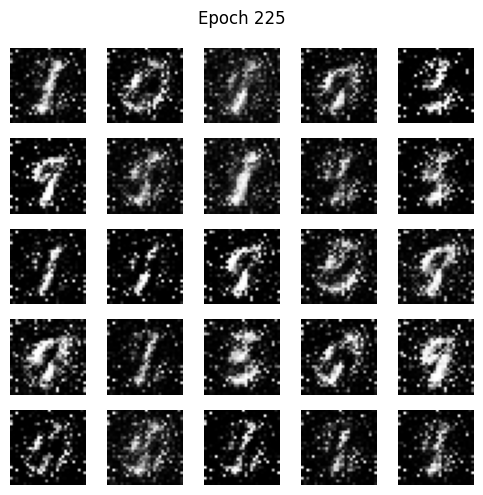

  226 [D loss: 3.0025, acc.: 0.00%] [G loss: 0.0044]
  227 [D loss: 3.0888, acc.: 0.00%] [G loss: 0.0040]
  228 [D loss: 2.9698, acc.: 0.00%] [G loss: 0.0044]
  229 [D loss: 2.9778, acc.: 0.00%] [G loss: 0.0045]
  230 [D loss: 3.0167, acc.: 0.00%] [G loss: 0.0038]
  231 [D loss: 3.0022, acc.: 0.00%] [G loss: 0.0038]
  232 [D loss: 3.0898, acc.: 0.00%] [G loss: 0.0042]
  233 [D loss: 3.0949, acc.: 0.00%] [G loss: 0.0034]
  234 [D loss: 3.0303, acc.: 0.00%] [G loss: 0.0036]
  235 [D loss: 3.0878, acc.: 0.00%] [G loss: 0.0037]
  236 [D loss: 3.0263, acc.: 0.00%] [G loss: 0.0037]
  237 [D loss: 3.1570, acc.: 0.00%] [G loss: 0.0040]
  238 [D loss: 3.1023, acc.: 0.00%] [G loss: 0.0039]
  239 [D loss: 3.1556, acc.: 0.00%] [G loss: 0.0036]
  240 [D loss: 3.1023, acc.: 0.00%] [G loss: 0.0039]
  241 [D loss: 3.1657, acc.: 0.00%] [G loss: 0.0038]
  242 [D loss: 3.0644, acc.: 0.00%] [G loss: 0.0038]
  243 [D loss: 3.0788, acc.: 0.00%] [G loss: 0.0037]
  244 [D loss: 3.0331, acc.: 0.00%] [G loss: 0

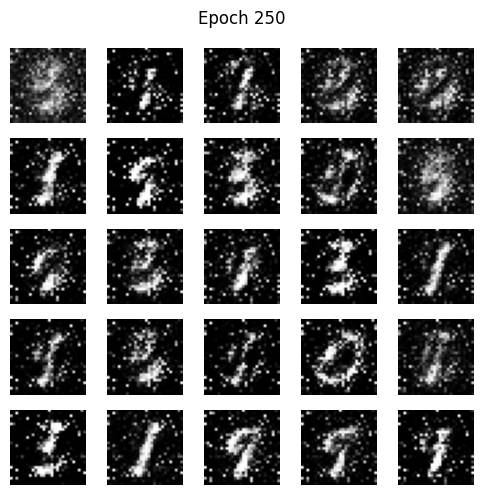

  251 [D loss: 3.1095, acc.: 0.00%] [G loss: 0.0032]
  252 [D loss: 3.0903, acc.: 0.00%] [G loss: 0.0032]
  253 [D loss: 3.1280, acc.: 0.00%] [G loss: 0.0036]
  254 [D loss: 3.1242, acc.: 0.00%] [G loss: 0.0032]
  255 [D loss: 3.1252, acc.: 0.00%] [G loss: 0.0039]
  256 [D loss: 3.1859, acc.: 0.00%] [G loss: 0.0031]
  257 [D loss: 3.1883, acc.: 0.00%] [G loss: 0.0039]
  258 [D loss: 3.1835, acc.: 0.00%] [G loss: 0.0030]
  259 [D loss: 3.1117, acc.: 0.00%] [G loss: 0.0033]
  260 [D loss: 3.1676, acc.: 0.00%] [G loss: 0.0031]
  261 [D loss: 3.1646, acc.: 0.00%] [G loss: 0.0032]
  262 [D loss: 3.1504, acc.: 0.00%] [G loss: 0.0029]
  263 [D loss: 3.1608, acc.: 0.00%] [G loss: 0.0033]
  264 [D loss: 3.1504, acc.: 0.00%] [G loss: 0.0031]
  265 [D loss: 3.1356, acc.: 0.00%] [G loss: 0.0032]
  266 [D loss: 3.1103, acc.: 0.00%] [G loss: 0.0033]
  267 [D loss: 3.1539, acc.: 0.00%] [G loss: 0.0029]
  268 [D loss: 3.2194, acc.: 0.00%] [G loss: 0.0032]
  269 [D loss: 3.1284, acc.: 0.00%] [G loss: 0

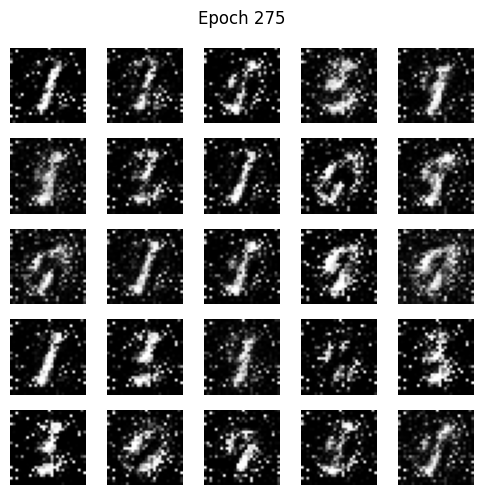

  276 [D loss: 3.2377, acc.: 0.00%] [G loss: 0.0033]
  277 [D loss: 3.2900, acc.: 0.00%] [G loss: 0.0036]
  278 [D loss: 3.2346, acc.: 0.00%] [G loss: 0.0029]
  279 [D loss: 3.2589, acc.: 0.00%] [G loss: 0.0025]
  280 [D loss: 3.2488, acc.: 0.00%] [G loss: 0.0028]
  281 [D loss: 3.2309, acc.: 0.00%] [G loss: 0.0028]
  282 [D loss: 3.3118, acc.: 0.00%] [G loss: 0.0032]
  283 [D loss: 3.1622, acc.: 0.00%] [G loss: 0.0029]
  284 [D loss: 3.2060, acc.: 0.00%] [G loss: 0.0025]
  285 [D loss: 3.2566, acc.: 0.00%] [G loss: 0.0027]
  286 [D loss: 3.1211, acc.: 0.00%] [G loss: 0.0031]
  287 [D loss: 3.1838, acc.: 0.00%] [G loss: 0.0029]
  288 [D loss: 3.1901, acc.: 0.00%] [G loss: 0.0026]
  289 [D loss: 3.2287, acc.: 0.00%] [G loss: 0.0024]
  290 [D loss: 3.2491, acc.: 0.00%] [G loss: 0.0030]
  291 [D loss: 3.2343, acc.: 0.00%] [G loss: 0.0024]
  292 [D loss: 3.1994, acc.: 0.00%] [G loss: 0.0027]
  293 [D loss: 3.2659, acc.: 0.00%] [G loss: 0.0026]
  294 [D loss: 3.2733, acc.: 0.00%] [G loss: 0

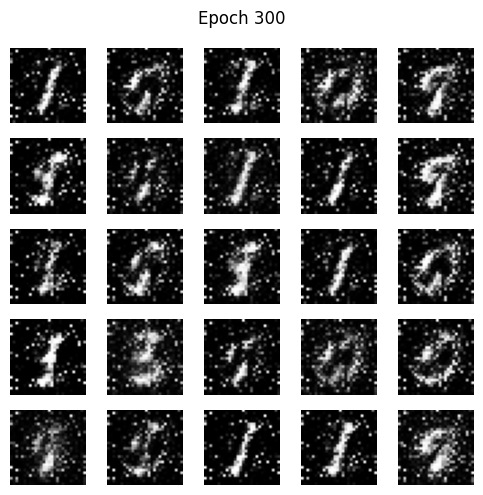

  301 [D loss: 3.1759, acc.: 0.00%] [G loss: 0.0028]
  302 [D loss: 3.1944, acc.: 0.00%] [G loss: 0.0026]
  303 [D loss: 3.3084, acc.: 0.00%] [G loss: 0.0027]
  304 [D loss: 3.3090, acc.: 0.00%] [G loss: 0.0026]
  305 [D loss: 3.3359, acc.: 0.00%] [G loss: 0.0026]
  306 [D loss: 3.2339, acc.: 0.00%] [G loss: 0.0024]
  307 [D loss: 3.2774, acc.: 0.00%] [G loss: 0.0023]
  308 [D loss: 3.3870, acc.: 0.00%] [G loss: 0.0024]
  309 [D loss: 3.3102, acc.: 0.00%] [G loss: 0.0022]
  310 [D loss: 3.3127, acc.: 0.00%] [G loss: 0.0021]
  311 [D loss: 3.3139, acc.: 0.00%] [G loss: 0.0025]
  312 [D loss: 3.3987, acc.: 0.00%] [G loss: 0.0024]
  313 [D loss: 3.2825, acc.: 0.00%] [G loss: 0.0022]
  314 [D loss: 3.1862, acc.: 0.00%] [G loss: 0.0022]
  315 [D loss: 3.2522, acc.: 0.00%] [G loss: 0.0029]
  316 [D loss: 3.2839, acc.: 0.00%] [G loss: 0.0021]
  317 [D loss: 3.3178, acc.: 0.00%] [G loss: 0.0019]
  318 [D loss: 3.3667, acc.: 0.00%] [G loss: 0.0041]
  319 [D loss: 3.3614, acc.: 0.00%] [G loss: 0

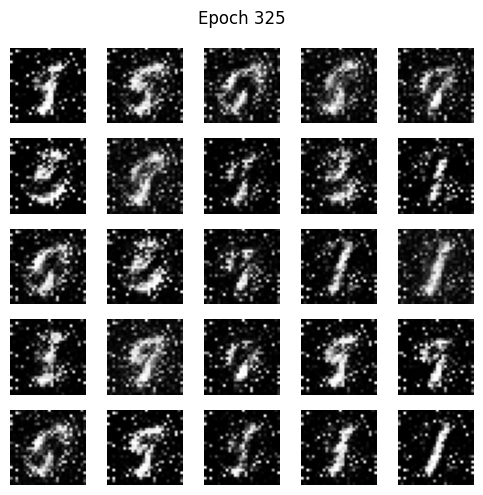

  326 [D loss: 3.3542, acc.: 0.00%] [G loss: 0.0022]
  327 [D loss: 3.3076, acc.: 0.00%] [G loss: 0.0022]
  328 [D loss: 3.2720, acc.: 0.00%] [G loss: 0.0021]
  329 [D loss: 3.3685, acc.: 0.00%] [G loss: 0.0025]
  330 [D loss: 3.3632, acc.: 0.00%] [G loss: 0.0017]
  331 [D loss: 3.3159, acc.: 0.00%] [G loss: 0.0022]
  332 [D loss: 3.3691, acc.: 0.00%] [G loss: 0.0023]
  333 [D loss: 3.3431, acc.: 0.00%] [G loss: 0.0020]
  334 [D loss: 3.3929, acc.: 0.00%] [G loss: 0.0020]
  335 [D loss: 3.3749, acc.: 0.00%] [G loss: 0.0020]
  336 [D loss: 3.4516, acc.: 0.00%] [G loss: 0.0020]
  337 [D loss: 3.3592, acc.: 0.00%] [G loss: 0.0020]
  338 [D loss: 3.3935, acc.: 0.00%] [G loss: 0.0019]
  339 [D loss: 3.3366, acc.: 0.00%] [G loss: 0.0021]
  340 [D loss: 3.3379, acc.: 0.00%] [G loss: 0.0021]
  341 [D loss: 3.3110, acc.: 0.00%] [G loss: 0.0021]
  342 [D loss: 3.3723, acc.: 0.00%] [G loss: 0.0020]
  343 [D loss: 3.4410, acc.: 0.00%] [G loss: 0.0028]
  344 [D loss: 3.3245, acc.: 0.00%] [G loss: 0

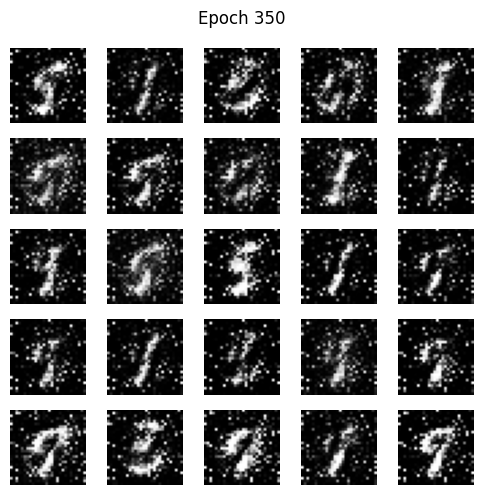

  351 [D loss: 3.3944, acc.: 0.00%] [G loss: 0.0018]
  352 [D loss: 3.3308, acc.: 0.00%] [G loss: 0.0019]
  353 [D loss: 3.4174, acc.: 0.00%] [G loss: 0.0018]
  354 [D loss: 3.3716, acc.: 0.00%] [G loss: 0.0019]
  355 [D loss: 3.4929, acc.: 0.00%] [G loss: 0.0022]
  356 [D loss: 3.4388, acc.: 0.00%] [G loss: 0.0020]
  357 [D loss: 3.4422, acc.: 0.00%] [G loss: 0.0019]
  358 [D loss: 3.4559, acc.: 0.00%] [G loss: 0.0021]
  359 [D loss: 3.4353, acc.: 0.00%] [G loss: 0.0019]
  360 [D loss: 3.4257, acc.: 0.00%] [G loss: 0.0020]
  361 [D loss: 3.3959, acc.: 0.00%] [G loss: 0.0019]
  362 [D loss: 3.3674, acc.: 0.00%] [G loss: 0.0020]
  363 [D loss: 3.5245, acc.: 0.00%] [G loss: 0.0017]
  364 [D loss: 3.3983, acc.: 0.00%] [G loss: 0.0022]
  365 [D loss: 3.5063, acc.: 0.00%] [G loss: 0.0026]
  366 [D loss: 3.4617, acc.: 0.00%] [G loss: 0.0020]
  367 [D loss: 3.4521, acc.: 0.00%] [G loss: 0.0019]
  368 [D loss: 3.3882, acc.: 0.00%] [G loss: 0.0017]
  369 [D loss: 3.3736, acc.: 0.00%] [G loss: 0

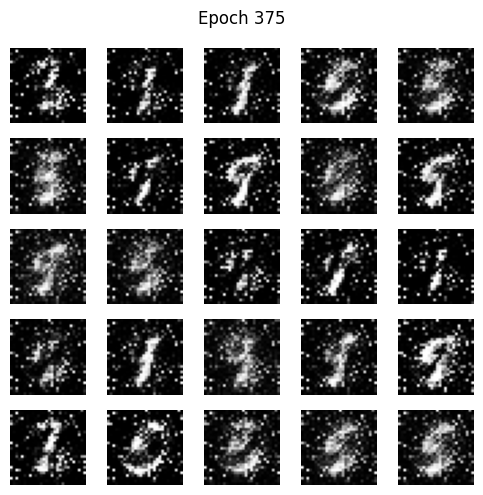

  376 [D loss: 3.4370, acc.: 0.00%] [G loss: 0.0021]
  377 [D loss: 3.5343, acc.: 0.00%] [G loss: 0.0017]
  378 [D loss: 3.5937, acc.: 0.00%] [G loss: 0.0017]
  379 [D loss: 3.4505, acc.: 0.00%] [G loss: 0.0020]
  380 [D loss: 3.4968, acc.: 0.00%] [G loss: 0.0017]
  381 [D loss: 3.4150, acc.: 0.00%] [G loss: 0.0020]
  382 [D loss: 3.4892, acc.: 0.00%] [G loss: 0.0017]
  383 [D loss: 3.4310, acc.: 0.00%] [G loss: 0.0018]
  384 [D loss: 3.4804, acc.: 0.00%] [G loss: 0.0022]
  385 [D loss: 3.5084, acc.: 0.00%] [G loss: 0.0016]
  386 [D loss: 3.4547, acc.: 0.00%] [G loss: 0.0018]
  387 [D loss: 3.4839, acc.: 0.00%] [G loss: 0.0014]
  388 [D loss: 3.4535, acc.: 0.00%] [G loss: 0.0015]
  389 [D loss: 3.4810, acc.: 0.00%] [G loss: 0.0016]
  390 [D loss: 3.5443, acc.: 0.00%] [G loss: 0.0018]
  391 [D loss: 3.5359, acc.: 0.00%] [G loss: 0.0016]
  392 [D loss: 3.4338, acc.: 0.00%] [G loss: 0.0016]
  393 [D loss: 3.5014, acc.: 0.00%] [G loss: 0.0016]
  394 [D loss: 3.4745, acc.: 0.00%] [G loss: 0

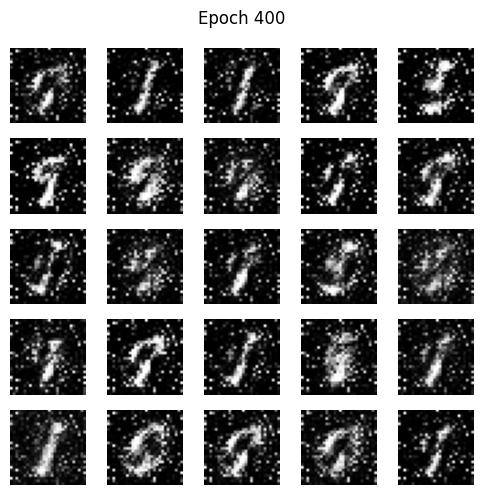

  401 [D loss: 3.5713, acc.: 0.00%] [G loss: 0.0016]
  402 [D loss: 3.4616, acc.: 0.00%] [G loss: 0.0017]
  403 [D loss: 3.4773, acc.: 0.00%] [G loss: 0.0016]
  404 [D loss: 3.5063, acc.: 0.00%] [G loss: 0.0015]
  405 [D loss: 3.5768, acc.: 0.00%] [G loss: 0.0014]
  406 [D loss: 3.5435, acc.: 0.00%] [G loss: 0.0017]
  407 [D loss: 3.4853, acc.: 0.00%] [G loss: 0.0015]
  408 [D loss: 3.5033, acc.: 0.00%] [G loss: 0.0014]
  409 [D loss: 3.6263, acc.: 0.00%] [G loss: 0.0014]
  410 [D loss: 3.5227, acc.: 0.00%] [G loss: 0.0017]
  411 [D loss: 3.5850, acc.: 0.00%] [G loss: 0.0017]
  412 [D loss: 3.5341, acc.: 0.00%] [G loss: 0.0016]
  413 [D loss: 3.5834, acc.: 0.00%] [G loss: 0.0016]
  414 [D loss: 3.5028, acc.: 0.00%] [G loss: 0.0014]
  415 [D loss: 3.5199, acc.: 0.00%] [G loss: 0.0016]
  416 [D loss: 3.5406, acc.: 0.00%] [G loss: 0.0018]
  417 [D loss: 3.4731, acc.: 0.00%] [G loss: 0.0015]
  418 [D loss: 3.5440, acc.: 0.00%] [G loss: 0.0016]
  419 [D loss: 3.4891, acc.: 0.00%] [G loss: 0

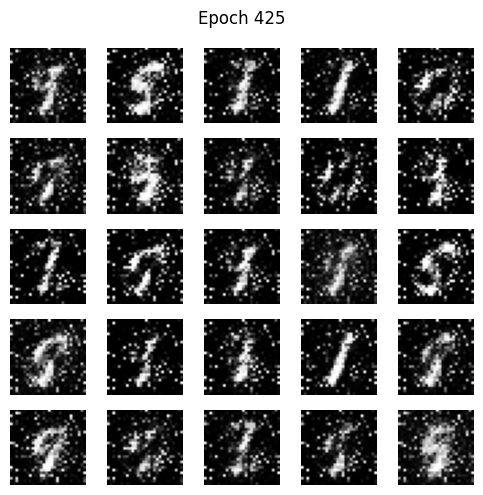

  426 [D loss: 3.5571, acc.: 0.00%] [G loss: 0.0015]
  427 [D loss: 3.5332, acc.: 0.00%] [G loss: 0.0016]
  428 [D loss: 3.6151, acc.: 0.00%] [G loss: 0.0015]
  429 [D loss: 3.5088, acc.: 0.00%] [G loss: 0.0017]
  430 [D loss: 3.5383, acc.: 0.00%] [G loss: 0.0022]
  431 [D loss: 3.5190, acc.: 0.00%] [G loss: 0.0013]
  432 [D loss: 3.5236, acc.: 0.00%] [G loss: 0.0014]
  433 [D loss: 3.6253, acc.: 0.00%] [G loss: 0.0014]
  434 [D loss: 3.6772, acc.: 0.00%] [G loss: 0.0015]
  435 [D loss: 3.5663, acc.: 0.00%] [G loss: 0.0015]
  436 [D loss: 3.5557, acc.: 0.00%] [G loss: 0.0013]
  437 [D loss: 3.5662, acc.: 0.00%] [G loss: 0.0013]
  438 [D loss: 3.5651, acc.: 0.00%] [G loss: 0.0014]
  439 [D loss: 3.5299, acc.: 0.00%] [G loss: 0.0013]
  440 [D loss: 3.5704, acc.: 0.00%] [G loss: 0.0014]
  441 [D loss: 3.6201, acc.: 0.00%] [G loss: 0.0013]
  442 [D loss: 3.5245, acc.: 0.00%] [G loss: 0.0014]
  443 [D loss: 3.6007, acc.: 0.00%] [G loss: 0.0014]
  444 [D loss: 3.5616, acc.: 0.00%] [G loss: 0

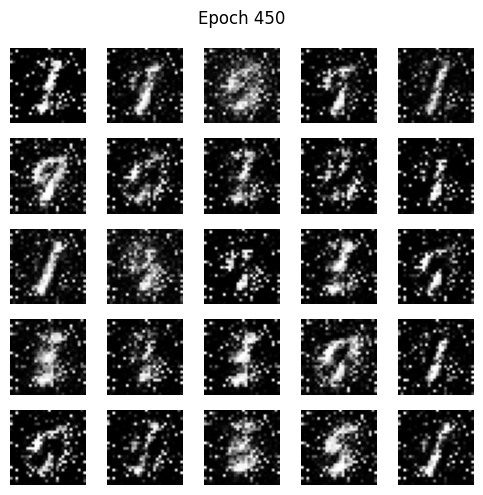

  451 [D loss: 3.6072, acc.: 0.00%] [G loss: 0.0013]
  452 [D loss: 3.5474, acc.: 0.00%] [G loss: 0.0011]
  453 [D loss: 3.6482, acc.: 0.00%] [G loss: 0.0012]
  454 [D loss: 3.6151, acc.: 0.00%] [G loss: 0.0013]
  455 [D loss: 3.5349, acc.: 0.00%] [G loss: 0.0014]
  456 [D loss: 3.6933, acc.: 0.00%] [G loss: 0.0033]
  457 [D loss: 3.7967, acc.: 0.00%] [G loss: 0.0012]
  458 [D loss: 3.5764, acc.: 0.00%] [G loss: 0.0014]
  459 [D loss: 3.6242, acc.: 0.00%] [G loss: 0.0013]
  460 [D loss: 3.6264, acc.: 0.00%] [G loss: 0.0013]
  461 [D loss: 3.6133, acc.: 0.00%] [G loss: 0.0013]
  462 [D loss: 3.6209, acc.: 0.00%] [G loss: 0.0012]
  463 [D loss: 3.5990, acc.: 0.00%] [G loss: 0.0012]
  464 [D loss: 3.5755, acc.: 0.00%] [G loss: 0.0013]
  465 [D loss: 3.6331, acc.: 0.00%] [G loss: 0.0014]
  466 [D loss: 3.5916, acc.: 0.00%] [G loss: 0.0012]
  467 [D loss: 3.5847, acc.: 0.00%] [G loss: 0.0013]
  468 [D loss: 3.5181, acc.: 0.00%] [G loss: 0.0011]
  469 [D loss: 3.6107, acc.: 0.00%] [G loss: 0

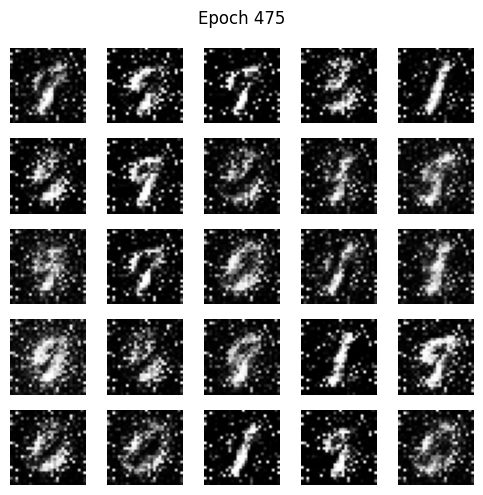

  476 [D loss: 3.6124, acc.: 0.00%] [G loss: 0.0014]
  477 [D loss: 3.7093, acc.: 0.00%] [G loss: 0.0011]
  478 [D loss: 3.6108, acc.: 0.00%] [G loss: 0.0011]
  479 [D loss: 3.6296, acc.: 0.00%] [G loss: 0.0012]
  480 [D loss: 3.5390, acc.: 0.00%] [G loss: 0.0010]
  481 [D loss: 3.6566, acc.: 0.00%] [G loss: 0.0011]
  482 [D loss: 3.6205, acc.: 0.00%] [G loss: 0.0012]
  483 [D loss: 3.6204, acc.: 0.00%] [G loss: 0.0013]
  484 [D loss: 3.6426, acc.: 0.00%] [G loss: 0.0014]
  485 [D loss: 3.7086, acc.: 0.00%] [G loss: 0.0011]
  486 [D loss: 3.6525, acc.: 0.00%] [G loss: 0.0011]
  487 [D loss: 3.6415, acc.: 0.00%] [G loss: 0.0011]
  488 [D loss: 3.7456, acc.: 0.00%] [G loss: 0.0010]
  489 [D loss: 3.7175, acc.: 0.00%] [G loss: 0.0010]
  490 [D loss: 3.6784, acc.: 0.00%] [G loss: 0.0011]
  491 [D loss: 3.6859, acc.: 0.00%] [G loss: 0.0011]
  492 [D loss: 3.7203, acc.: 0.00%] [G loss: 0.0011]
  493 [D loss: 3.6527, acc.: 0.00%] [G loss: 0.0012]
  494 [D loss: 3.6861, acc.: 0.00%] [G loss: 0

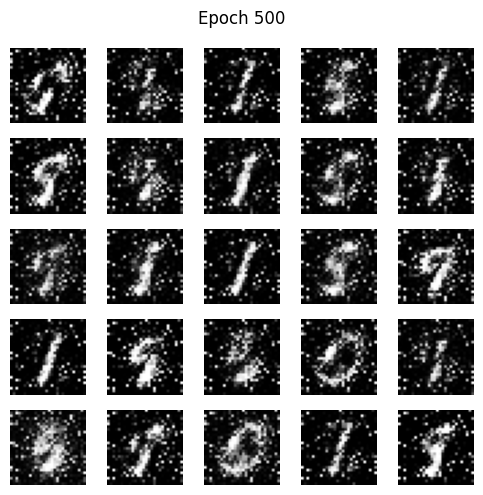

  501 [D loss: 3.6222, acc.: 0.00%] [G loss: 0.0010]
  502 [D loss: 3.7388, acc.: 0.00%] [G loss: 0.0011]
  503 [D loss: 3.7313, acc.: 0.00%] [G loss: 0.0012]
  504 [D loss: 3.6116, acc.: 0.00%] [G loss: 0.0011]
  505 [D loss: 3.7834, acc.: 0.00%] [G loss: 0.0014]
  506 [D loss: 3.6119, acc.: 0.00%] [G loss: 0.0010]
  507 [D loss: 3.7106, acc.: 0.00%] [G loss: 0.0012]
  508 [D loss: 3.7219, acc.: 0.00%] [G loss: 0.0010]
  509 [D loss: 3.7181, acc.: 0.00%] [G loss: 0.0011]
  510 [D loss: 3.6815, acc.: 0.00%] [G loss: 0.0009]
  511 [D loss: 3.7006, acc.: 0.00%] [G loss: 0.0011]
  512 [D loss: 3.7672, acc.: 0.00%] [G loss: 0.0010]
  513 [D loss: 3.6316, acc.: 0.00%] [G loss: 0.0009]
  514 [D loss: 3.7487, acc.: 0.00%] [G loss: 0.0010]
  515 [D loss: 3.7546, acc.: 0.00%] [G loss: 0.0011]
  516 [D loss: 3.7193, acc.: 0.00%] [G loss: 0.0010]
  517 [D loss: 3.6595, acc.: 0.00%] [G loss: 0.0010]
  518 [D loss: 3.6699, acc.: 0.00%] [G loss: 0.0011]
  519 [D loss: 3.7701, acc.: 0.00%] [G loss: 0

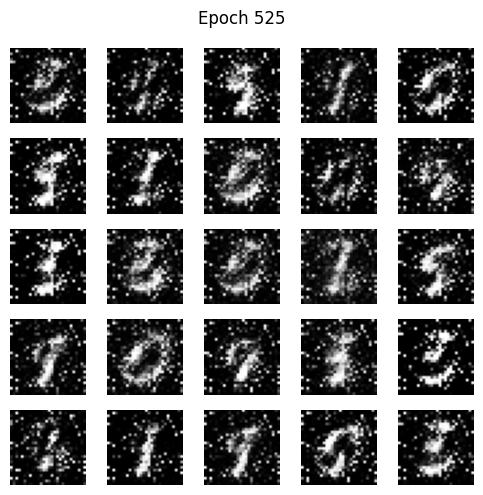

  526 [D loss: 3.7006, acc.: 0.00%] [G loss: 0.0010]
  527 [D loss: 3.7706, acc.: 0.00%] [G loss: 0.0011]
  528 [D loss: 3.6456, acc.: 0.00%] [G loss: 0.0009]
  529 [D loss: 3.7381, acc.: 0.00%] [G loss: 0.0010]
  530 [D loss: 3.7532, acc.: 0.00%] [G loss: 0.0009]
  531 [D loss: 3.7172, acc.: 0.00%] [G loss: 0.0010]
  532 [D loss: 3.7646, acc.: 0.00%] [G loss: 0.0012]
  533 [D loss: 3.7278, acc.: 0.00%] [G loss: 0.0010]
  534 [D loss: 3.6814, acc.: 0.00%] [G loss: 0.0012]
  535 [D loss: 3.8247, acc.: 0.00%] [G loss: 0.0010]
  536 [D loss: 3.7991, acc.: 0.00%] [G loss: 0.0009]
  537 [D loss: 3.7493, acc.: 0.00%] [G loss: 0.0010]
  538 [D loss: 3.7606, acc.: 0.00%] [G loss: 0.0014]
  539 [D loss: 3.7632, acc.: 0.00%] [G loss: 0.0008]
  540 [D loss: 3.7530, acc.: 0.00%] [G loss: 0.0009]
  541 [D loss: 3.7786, acc.: 0.00%] [G loss: 0.0011]
  542 [D loss: 3.7041, acc.: 0.00%] [G loss: 0.0010]
  543 [D loss: 3.7245, acc.: 0.00%] [G loss: 0.0011]
  544 [D loss: 3.8037, acc.: 0.00%] [G loss: 0

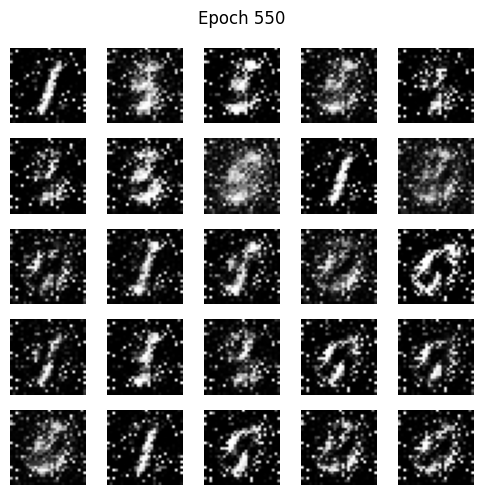

  551 [D loss: 3.7774, acc.: 0.00%] [G loss: 0.0011]
  552 [D loss: 3.7822, acc.: 0.00%] [G loss: 0.0011]
  553 [D loss: 3.8582, acc.: 0.00%] [G loss: 0.0009]
  554 [D loss: 3.7757, acc.: 0.00%] [G loss: 0.0010]
  555 [D loss: 3.7415, acc.: 0.00%] [G loss: 0.0010]
  556 [D loss: 3.8142, acc.: 0.00%] [G loss: 0.0011]
  557 [D loss: 3.7315, acc.: 0.00%] [G loss: 0.0009]
  558 [D loss: 3.8118, acc.: 0.00%] [G loss: 0.0008]
  559 [D loss: 3.8099, acc.: 0.00%] [G loss: 0.0010]
  560 [D loss: 3.7720, acc.: 0.00%] [G loss: 0.0008]
  561 [D loss: 3.8396, acc.: 0.00%] [G loss: 0.0010]
  562 [D loss: 3.7572, acc.: 0.00%] [G loss: 0.0009]
  563 [D loss: 3.8066, acc.: 0.00%] [G loss: 0.0008]
  564 [D loss: 3.7797, acc.: 0.00%] [G loss: 0.0009]
  565 [D loss: 3.7024, acc.: 0.00%] [G loss: 0.0009]
  566 [D loss: 3.7959, acc.: 0.00%] [G loss: 0.0010]
  567 [D loss: 3.7420, acc.: 0.00%] [G loss: 0.0009]
  568 [D loss: 3.7241, acc.: 0.00%] [G loss: 0.0009]


KeyboardInterrupt: 

In [47]:
train(epochs=1000, batch_size=100, print_interval=1, sample_interval=25)